In [2]:
import geopandas as gpd
import pandas as pd
import contextily as ctx
import numpy as np
import random
import rasterio
from rasterio.mask import mask
from rasterio.features import shapes
from rasterio.transform import from_origin
import matplotlib.pyplot as plt
import shapely
from shapely.geometry import Point, LineString, Polygon, shape
import os
import requests
import zipfile
import io
import glob
import folium
import contextily as cx
import time
from datetime import timedelta
import math
from scipy.stats import norm
from sklearn.neighbors import KernelDensity
from pykrige.ok import OrdinaryKriging
import chardet
import statistics as stats
from multiprocessing import Pool

directory = r'C:\Users\ericg\IBM_SI' # Change to your personal directory
os.chdir(directory)

In [4]:
# Bring in study area polygon
siBoundary = gpd.read_file(r'C:\Users\ericg\siBoundary_gJ.geojson')

# Set crs
siBoundary.set_crs('epsg:4326')

,id,0,geometry
0,0,1,"MULTIPOLYGON (((-109.2671 26.5, -109.26771 26...."


## Add Madrean Archipelago boundary

In [2]:
# Add madrean archipelago boundary from KML file
madArch = gpd.read_file('Madrean Archipelago Boundary.kml', driver = 'KML')

madArch

,Name,Description,geometry
0,footprint.3098606,"<h4>footprint</h4> <ul class=""textattributes"">...",GEOMETRYCOLLECTION (POINT (-110.03678 31.02182...


## Add Abert's Squirrel Data

In [154]:
# Bring in Abert's Squirrel data from .csv
aberts = gpd.read_file(r"C:\Users\ericg\siAberts.geojson") # Change to your GeoJSON path

aberts.head()

,id,gbifID,accessRights,bibliographicCitation,language,license,modified,publisher,references,rightsHolder,...,level0Gid,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name,iucnRedListCategory,geometry
0,856,4506328860,None,None,None,CC_BY_NC_4_0,12/25/2023 18:50,None,https://www.inaturalist.org/observations/19485...,Alejandro Sigala Chávez,...,MEX,México,MEX.6_1,Chihuahua,MEX.6.26_2,Guachochi,None,None,LC,POINT (-107.26522 26.78182)
1,2879,1895032143,None,Sánchez-Cordero V. 2006. Estado actual del con...,es,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,MEX,México,MEX.6_1,Chihuahua,MEX.6.26_2,Guachochi,None,None,LC,POINT (-107.53333 26.81667)
2,2810,1895626650,None,Ceballos G. 2002. Actualización de la base de ...,es,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,MEX,México,MEX.6_1,Chihuahua,MEX.6.26_2,Guachochi,None,None,LC,POINT (-107.53333 26.81667)
3,2255,2629073489,None,Ballesteros B. C. 2016. Distribución potencial...,es,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,MEX,México,MEX.6_1,Chihuahua,MEX.6.26_2,Guachochi,None,None,LC,POINT (-107.08053 26.82155)
4,3843,1145871043,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,8/14/2024 20:52,None,http://arctos.database.museum/guid/MVZ:Mamm:76324,None,...,MEX,México,MEX.6_1,Chihuahua,MEX.6.26_2,Guachochi,None,None,LC,POINT (-107.08085 26.82182)


## Add Mount Graham Red Squirrel Data

In [12]:
# Define a function to add .csv data and convert it to a GeoJSON
def CSV_to_GDF_and_GJ(csvFile,outGJ):

    # Use .read_csv() function to convert a .csv file to a DF
    df = pd.read_csv(csvFile)
    
    # Create a geometry column using the lat and lon fields
    geom = [Point(xy) for xy in zip(df['decimalLongitude'],df['decimalLatitude'])]
    
    # Create GDF from lats and lons in DF
    gdf = gpd.GeoDataFrame(df, geometry = geom)
    
    # Make sure GDF is WGS84
    gdf.set_crs(epsg = 4326, inplace = True)
    
    # Save siBoundary as GeoJSON
    gJ_string = gdf.to_json()
        
    # Write GeoJSON string to file
    with open(outGJ,'w') as f:
        f.write(gJ_string)

    # Return the GDF
    return gdf

In [13]:
red_squirrel = CSV_to_GDF_and_GJ(r"C:\Users\ericg\IBM_SI\Species_Data\Red Squirrel\Red Squirrel Occurences.csv",'red_squirrel.geojson')

C:\Users\ericg\AppData\Local\Temp\ipykernel_25620\870672995.py:5: DtypeWarning: Columns (2,12,16,19,23,28,31,33,35,38,41,42,43,44,45,53,54,56,57,58,59,60,61,70,73,75,76,77,78,81,82,83,87,90,96,105,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,127,129,131,133,137,138,141,145,147,149,150,151,152,153,173,177,178,204,210) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(csvFile)


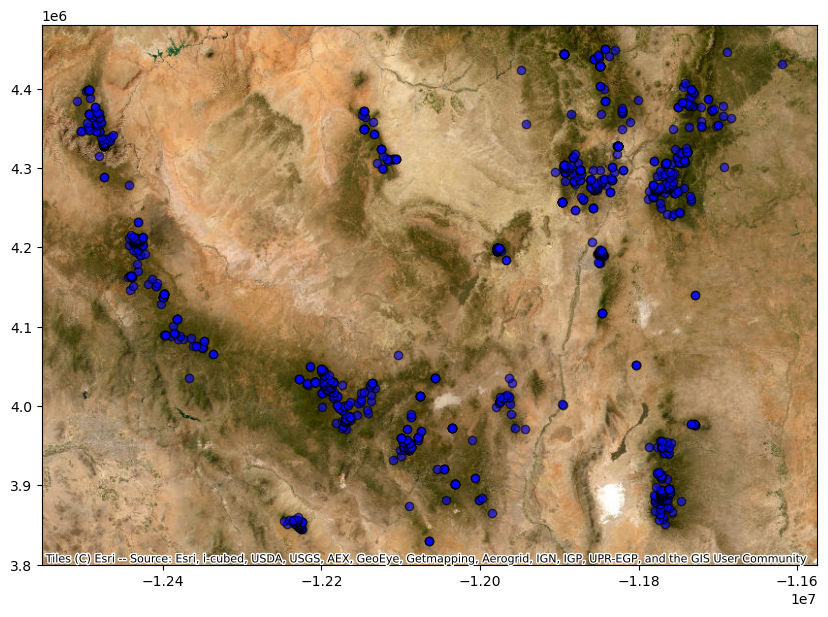

In [14]:
# Set red_squirrel variable equal to a GDF created from the GJ
red_squirrel = gpd.read_file('red_squirrel.geojson')

# Remove null coords
red_squirrel = red_squirrel.dropna(subset=['geometry'])

# Clip red_squirrel data by the siBoundary GDF
red_squirrel = gpd.clip(red_squirrel,siBoundary)

# Convert features to EPSG:3857 for Web Mercator
f3857 = red_squirrel.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

In [ ]:
mt_graham = CSV_to_GDF_and_GJ(r"C:\Users\ericg\IBM_SI\Species_Data\Mount Graham Red Squirrel\Mount Graham Red Squirrel.csv",'mt_graham_red_squirrel.geojson')

In [40]:
# Make mt_graham equivalent to the geojson
mt_graham = gpd.read_file('mt_graham_red_squirrel.geojson')

# Remove null coordinates
mt_graham = mt_graham.dropna(subset=['geometry'])

In [98]:
# Define a function to turn a raster to a shapefile
def raster_to_shapefile(raster_path, output_shapefile, threshold, operator='>='):

    # Open the raster file
    with rasterio.open(raster_path) as src:

        # Read the first band
        raster = src.read(1)
        transform = src.transform
        crs = src.crs

        # Apply threshold to the raster
        if operator == '>=':
            mask = raster >= threshold
        elif operator == '<=':
            mask = raster <= threshold
        elif operator == '==':
            mask = raster == threshold
        elif operator == '>':
            mask = raster > threshold
        elif operator == '<':
            mask = raster < threshold
        else:
            raise ValueError(f"Unsupported operator: {operator}")

        # Vectorize the raster based on the mask
        shapes_generator = shapes(raster, mask=mask, transform=transform)
        geometries = []
        for geom, value in shapes_generator:

            # Only include shapes with valid values
            if value:
                geometries.append(shape(geom))

    # Create a GeoDataFrame from the geometries
    gdf = gpd.GeoDataFrame(geometry=geometries, crs=crs)

    # Save the GeoDataFrame to a shapefile
    gdf.to_file(output_shapefile)

    print(f"Shapefile saved to {output_shapefile}")

In [99]:
raster_to_shapefile(r"C:\Users\ericg\siRast.tif", 'SI.shp', 27)

Shapefile saved to SI.shp


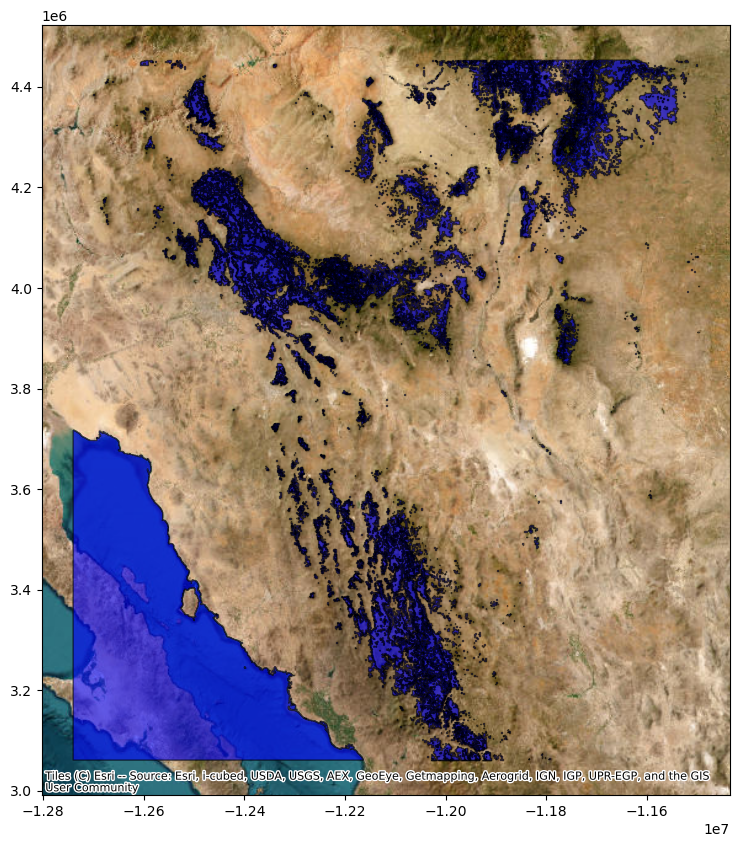

In [16]:
# Create sky islands gdf
siGDF = gpd.read_file('SI.shp')

# Convert features to EPSG:3857 for Web Mercator
f3857 = siGDF.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

In [101]:
# Clip the Mount Graham Red Squirrel data with the pinaleno_gdf
mt_graham = gpd.clip(mt_graham,pinaleno_gdf)

# Show the geodataframe
mt_graham.head()

,id,gbifID,accessRights,bibliographicCitation,language,license,modified,publisher,references,rightsHolder,...,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name,iucnRedListCategory,geometry,value
32,32,1145348571,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,10/16/2024 0:08,None,http://arctos.database.museum/guid/MSB:Mamm:59009,None,...,United States,USA.3_1,Arizona,USA.3.5_1,Graham,None,None,None,POINT (-109.82613 32.62186),[15.0]
27,27,1145366914,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,10/12/2024 12:52,None,http://arctos.database.museum/guid/MSB:Mamm:75707,None,...,United States,USA.3_1,Arizona,USA.3.5_1,Graham,None,None,None,POINT (-109.82103 32.63086),[15.5]
29,29,1145366907,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,10/12/2024 15:50,None,http://arctos.database.museum/guid/MSB:Mamm:75706,None,...,United States,USA.3_1,Arizona,USA.3.5_1,Graham,None,None,None,POINT (-109.82103 32.63086),[15.5]
31,31,1145360741,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,10/12/2024 17:28,None,http://arctos.database.museum/guid/MSB:Mamm:70049,None,...,United States,USA.3_1,Arizona,USA.3.5_1,Graham,None,None,None,POINT (-109.84353 32.64086),[13.7]
21,21,1145842198,http://vertnet.org/resources/norms.html,None,en,CC0_1_0,10/16/2024 3:04,None,http://arctos.database.museum/guid/MVZ:Mamm:50340,None,...,United States,USA.3_1,Arizona,USA.3.5_1,Graham,None,None,None,POINT (-109.81883 32.68156),[17.4]


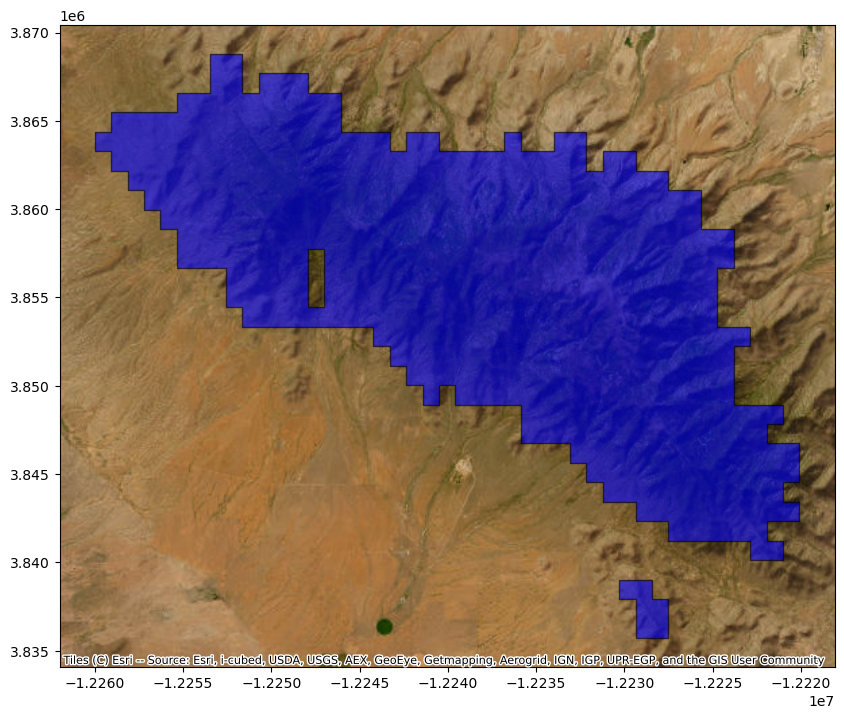

In [17]:
# Create clipping geometry of pinaleno mountains
pinalenoClip = Polygon([[-109.73,32.8],[-110.15,32.8],[-110.15,32.55],[-109.73,32.55]])

# Clip sky islands geodataframe to output just a polygon of the Pinaleno Mountains sky island
pinaleno = gpd.clip(siGDF,pinalenoClip)

# Dissolve the GDF
pinaleno = pinaleno.dissolve()

# Convert features to EPSG:3857 for Web Mercator
f3857 = pinaleno.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

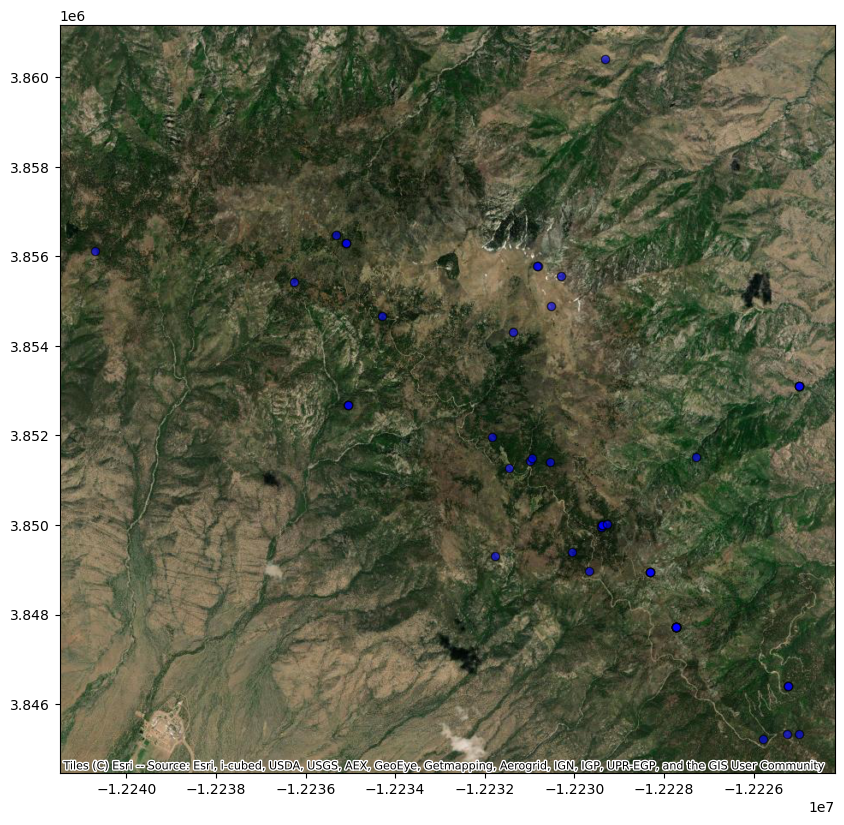

In [18]:
# Create a GDF of Mount Graham Red Squirrels using the Red Squirrels
mt_graham_red_squirrel = gpd.clip(red_squirrel,pinaleno)

# Convert features to EPSG:3857 for Web Mercator
f3857 = mt_graham_red_squirrel.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Pinaleno Boundary")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

In [40]:
# Clip Aberts Squirrel data by the Madrean Archipelago boundary
aberts = gpd.clip(aberts,madArch)

aberts.head()

,id,gbifID,accessRights,bibliographicCitation,language,license,modified,publisher,references,rightsHolder,...,level0Name,level1Gid,level1Name,level2Gid,level2Name,level3Gid,level3Name,iucnRedListCategory,geometry,value
757,1321,3902768205,None,None,None,CC_BY_NC_4_0,7/3/2023 1:32,None,https://www.inaturalist.org/observations/13482...,jorgeortizv,...,México,MEX.26_1,Sonora,MEX.26.42_2,Nácori Chico,None,None,LC,POINT (-108.70524 29.84779),[18.6]
758,2632,1987315355,None,None,None,CC_BY_NC_4_0,10/8/2015 19:00,None,None,None,...,México,MEX.26_1,Sonora,MEX.26.32_2,Huachinera,None,None,LC,POINT (-108.95872 30.20931),[24.1]
759,2849,1895549122,None,Ceballos-González G. J. y R. List. 2011. Inven...,None,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,México,MEX.6_1,Chihuahua,MEX.6.34_2,Janos,None,None,LC,POINT (-108.61222 30.54833),[15.6]
760,2848,1895549127,None,Ceballos-González G. J. y R. List. 2011. Inven...,None,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,México,MEX.6_1,Chihuahua,MEX.6.34_2,Janos,None,None,LC,POINT (-108.62083 30.54944),[15.7]
761,2844,1895549331,None,Ceballos-González G. J. y R. List. 2011. Inven...,None,CC_BY_4_0,3/18/2021 19:00,None,None,Comisión Nacional para el Conocimiento y Uso d...,...,México,MEX.6_1,Chihuahua,MEX.6.34_2,Janos,None,None,LC,POINT (-108.61694 30.55306),[15.9]


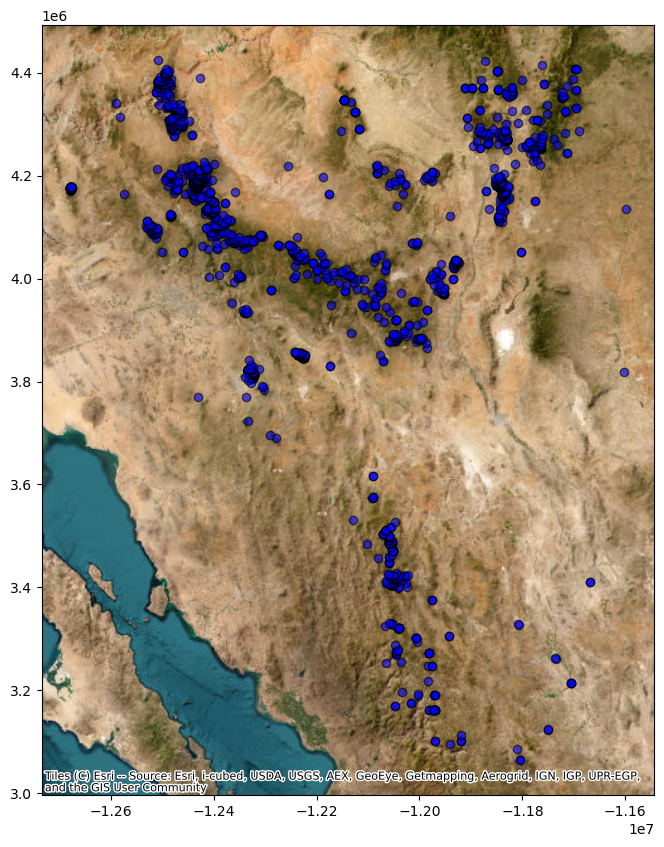

In [5]:
# Convert features to EPSG:3857 for Web Mercator
f3857 = aberts.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Abert's Squirrels")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

In [140]:
# Define a function to generate random points within a polygon
def gen_random_pts(polygon, numPts):

    # Create empty list to add points to
    points = []
    
    # Find bounds of the polygon
    bounds = polygon.total_bounds

    # As long as the number of points is less than the user-defined number of points
    while len(points) < numPts:
        
        # Generate random x and y within the bounding box
        random_x = np.random.uniform(bounds[0], bounds[2])
        random_y = np.random.uniform(bounds[1], bounds[3])
        random_point = Point(random_x, random_y)

        # Create a variable to add the random points within the polygon to
        contains = polygon.contains(random_point)
        
        # Check if the point is within the polygon
        if contains.any():

            # If it does, add to the points list
            points.append(random_point)

    # Create a GeoDataFrame from the points
    gdf_points = gpd.GeoDataFrame(geometry=points, crs="EPSG:4326")

    # Return the output GDF
    return gdf_points

In [148]:
# Define a function to add individuals on the sky island based on current population
def addInds(gdf,polygon,num_of_inds):

    # Subtract the current number of individuals by the length of the geodataframe to find the number of random individuals to add
    randomNum = num_of_inds - len(gdf)

    # Generate random points within the input polygon
    randPts = gen_random_pts(polygon,randomNum)

    # Add individuals to the previous GDF
    updated_gdf = pd.concat([gdf,randPts],ignore_index=True)

    # Return the updated GDF
    return updated_gdf

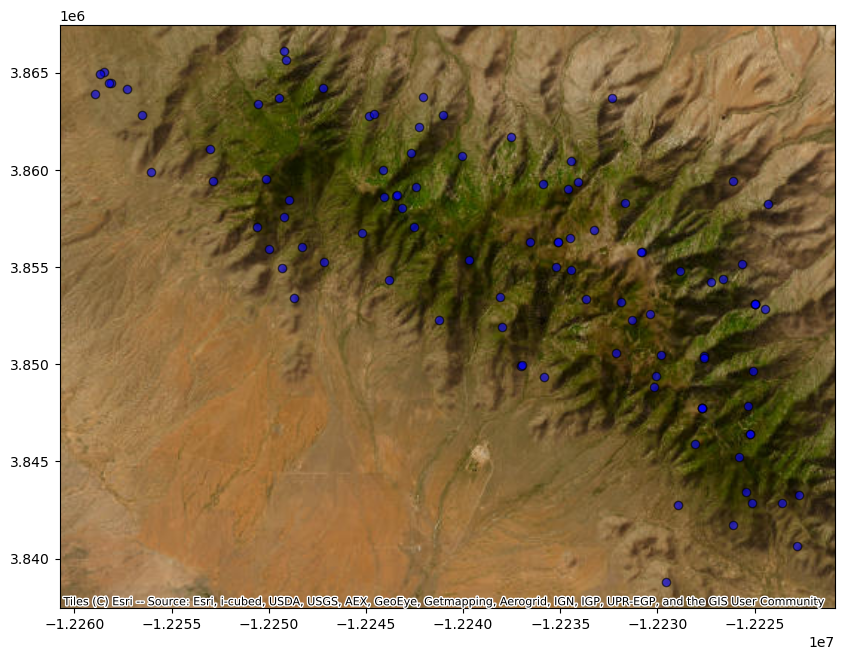

In [149]:
# Create updated GDF
mt_graham = addInds(mt_graham,pinaleno,100)

# Convert features to EPSG:3857 for Web Mercator
f3857 = mt_graham.to_crs(epsg = 3857)

# Create the plot
fig, ax = plt.subplots(figsize = (10,10))

# Add features in "features" to the plot
f3857.plot(ax = ax, color = 'blue', edgecolor = 'black', alpha = 0.6, label = "Abert's Squirrels")

# Add satellite imagery basemap
ctx.add_basemap(ax, source=ctx.providers.Esri.WorldImagery)

# Show the plot
plt.show()

## Clip Rasters

In [48]:
# Define a function to clip the precipitation and temperature data to the study area
def clipRasters(folderPath, studyArea, outPrefix):

    # Generate a list on GeoTIFFs utilizing the user-defined folder path
    rastList = glob.glob(os.path.join(folderPath, '*.tif'))

    # Set a value for months
    month = 0
    
    # Iterate through each raster in the raster list
    for raster in rastList:

        # Add one for the month number
        month += 1
        
        # Make sure the rasters have the correct coordinate system
        rast = rasterio.open(raster)

        # Set a variable containing the raster coordinate system
        rastCrs = rast.crs

        # If the clipping polygon has a different coordinate system as the raster
        if studyArea.crs != rastCrs:

            # Change the coordinate system
            studyArea = studyArea.to_crs(rastCrs)
        
        # Convert the polygons to GeoJSON format for rasterio
        polygon_geom = [polygon['geometry'] for polygon in studyArea.to_dict(orient="records")]
        
        # Open the raster and clip it with the polygon
        out_image, out_transform = mask(rast, polygon_geom, crop=True)

        # Assign metadata to a variable
        out_meta = rast.meta.copy()
        
        # Update metadata to match the clipped output
        out_meta.update({
            "driver": "GTiff",
            "height": out_image.shape[1],
            "width": out_image.shape[2],
            "transform": out_transform
        })
        
        # Save the clipped raster with an output name (1-12 for temp and prec)
        with rasterio.open(f'{outPrefix}_{str(month).zfill(2)}.tif', "w", **out_meta) as dest:
            dest.write(out_image)

    print('Done. Rasters saved in directory.')

In [49]:
clipRasters(
    r'C:\Users\ericg\OneDrive\Documents\Evolution Model Sky Islands\Precipitation\wc2.1_30s_prec', 
    siBoundary, 
    'Precipitation'
)

CPLE_AppDefinedError: Deleting Precipitation_10.tif failed: Permission denied

In [27]:
clipRasters(
    r'C:\Users\ericg\OneDrive\Documents\Evolution Model Sky Islands\Temperature\wc2.1_30s_tavg', 
    siBoundary, 
    'Temperature'
)

Done. Rasters saved in directory.


In [47]:
# Create list of rasters
rasters = glob.glob(os.path.join(directory, '*.tif'))

# Set basenames since the files come from the directory
raster_basenames = [os.path.basename(file) for file in rasters]

# Create empty list
rastList = []

# Iterate through each raster
for raster in raster_basenames:

    # Create empty list
    raster_ind_list = []

    # Add the raster to a list
    raster_ind_list.append(raster)

    # Add unit info
    # If it is a precipitation raster
    if raster[0] == 'P':

        # Set the units as millimeters
        raster_ind_list.append('Precipitation (mm)')

    # If it is a temperature raster
    elif raster[0] == 'T':

        # Set the units as Celsius
        raster_ind_list.append('Temperature (degrees C)')

    # If it is an NDVI raster:
    elif raster[0] == 's':

        # Set the units x10000
        raster_ind_list.append('NDVI Value (x10000)')

    # Append the raster_ind_list into the rastList to create a nested list
    rastList.append(raster_ind_list)

    # Move rasters so they go in month order
    block = rastList[1:4]
        
    # Remove the block from the original list
    rastList = rastList[:1] + rastList[4:]
        
    # Add the block to the end
    rastList.extend(block)

# Print the list to make sure it is correct
print(rastList)

[['Precipitation_1.tif', 'Precipitation (mm)'], ['Temperature_4.tif', 'Temperature (degrees C)'], ['Precipitation_9.tif', 'Precipitation (mm)'], ['Precipitation_3.tif', 'Precipitation (mm)'], ['Temperature_11.tif', 'Temperature (degrees C)'], ['Temperature_5.tif', 'Temperature (degrees C)'], ['Precipitation_2.tif', 'Precipitation (mm)'], ['Precipitation_7.tif', 'Precipitation (mm)'], ['siNDVI_float.tif', 'NDVI Value (x10000)'], ['Temperature_6.tif', 'Temperature (degrees C)'], ['Temperature_12.tif', 'Temperature (degrees C)'], ['Precipitation_5.tif', 'Precipitation (mm)'], ['Precipitation_10.tif', 'Precipitation (mm)'], ['Temperature_7.tif', 'Temperature (degrees C)'], ['Precipitation_11.tif', 'Precipitation (mm)'], ['Temperature_2.tif', 'Temperature (degrees C)'], ['Temperature_1.tif', 'Temperature (degrees C)'], ['Temperature_8.tif', 'Temperature (degrees C)'], ['Precipitation_8.tif', 'Precipitation (mm)'], ['Precipitation_4.tif', 'Precipitation (mm)'], ['Temperature_3.tif', 'Tempera

In [21]:
# Create a function which extracts raster values to a point GDF
def create_raster_val_list(rasterPath, ptsGDF):

    # Open the raster to extract values from
    with rasterio.open(rasterPath) as src:

        # Create a coord_list variable
        coords = [(x, y) for x, y in zip(ptsGDF['geometry'].x, ptsGDF['geometry'].y)]

        # Add values into GDF
        ptsGDF['value'] = [x for x in src.sample(coords)]

        # Create a list with values
        valList = ptsGDF['value'].tolist()

        # Transform numpy array values to float
        outList = [val.item() for val in valList]

    # Return the number of true points
    return outList

## Find Preferences

In [22]:
# Define a function to find preferences of species
def findPrefs(data, rastList, speciesName):

    # Create inanimate dictionary
    listDict = {}
    
    # Iterate through each raster in the list
    for rast in rastList:
    
        # Collect raster values where species occurrence data
        valList = create_raster_val_list(rast[0],data)
    
        # Print mean and standard deviation of the valList
        mean = stats.mean(valList)
        std_dev = stats.stdev(valList)
    
        # Remove .tif in the raster to use in the title and for the list
        titleInfo = rast[0].replace('.tif','')
    
        # Add lists to a dictionary to reference later
        listDict[f'{titleInfo}'] = valList
    
        # Create figure with axis
        fig, ax = plt.subplots(figsize=(8,6))
        
        # Create a boxplot
        ax.boxplot(valList)
        
        # Set plot title and axis titles
        ax.set_title(f"{speciesName} Preferences - {titleInfo}")
        ax.set_ylabel(rast[1])
        
        # Save the plot
        plt.savefig('Accuracy Assessment Boxplots.png', dpi = 300, bbox_inches = 'tight')
        
        # Show the plot
        plt.show()
    
        # Print the mean and standard deviation values for the points on each raster
        print(f'Mean: {mean}')
        print(f'Standard deviation: {std_dev}')
        print('')

    # Return the listDict
    return listDict

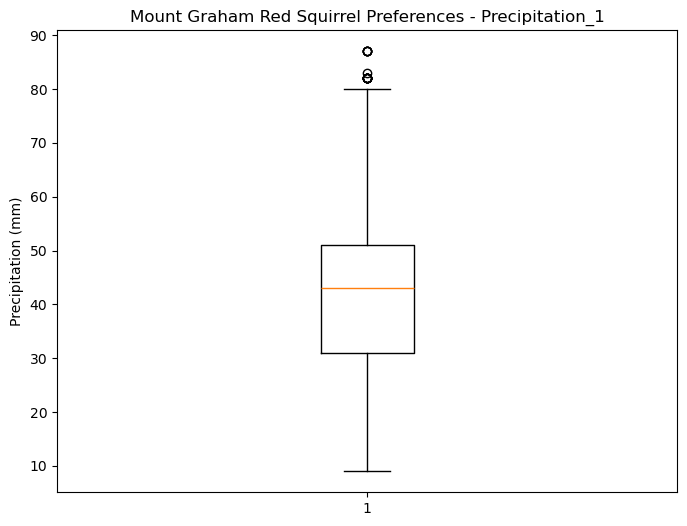

Mean: 41.555844155844156
Standard deviation: 13.949928965064398



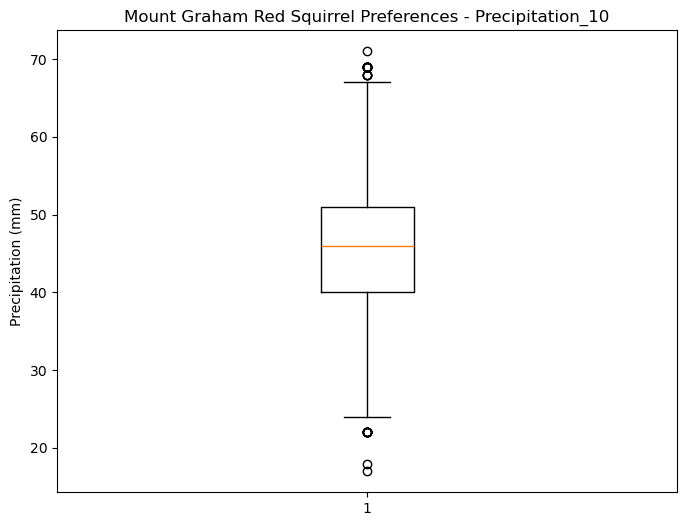

Mean: 45.67987012987013
Standard deviation: 7.985821417538549



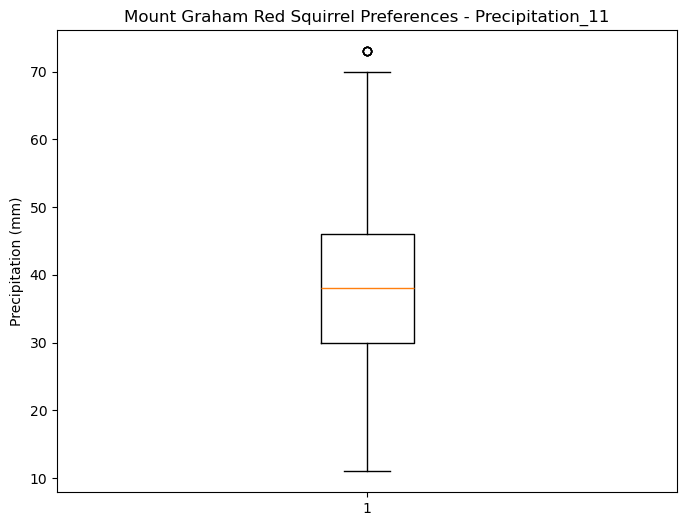

Mean: 38.194155844155844
Standard deviation: 11.11651761453794



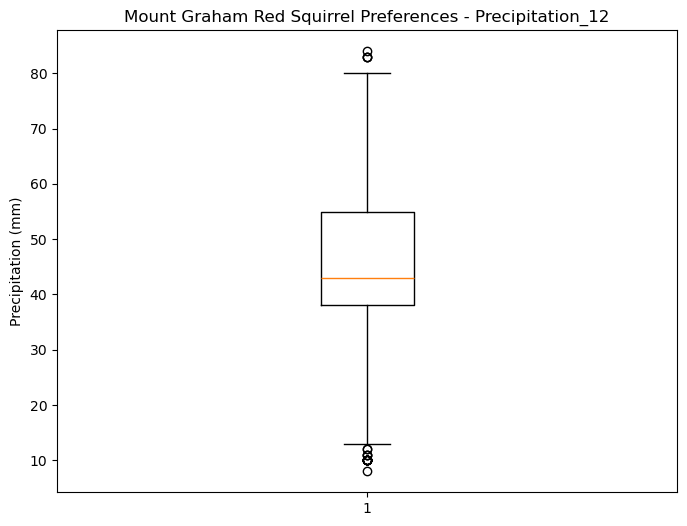

Mean: 45.22727272727273
Standard deviation: 13.167646336230057



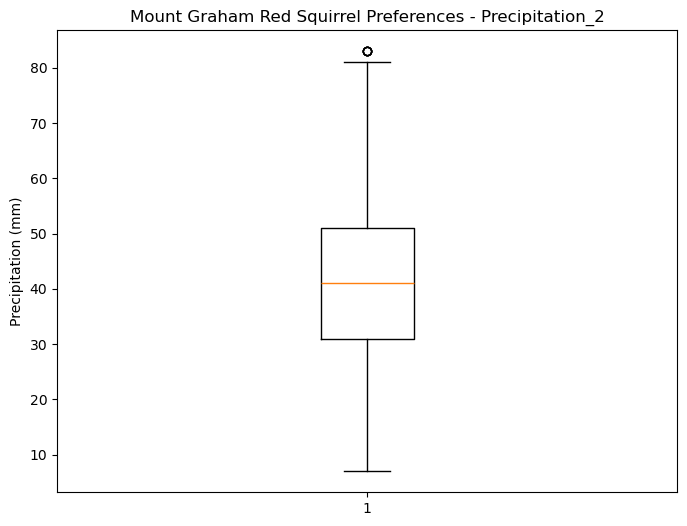

Mean: 40.66103896103896
Standard deviation: 14.502785068679692



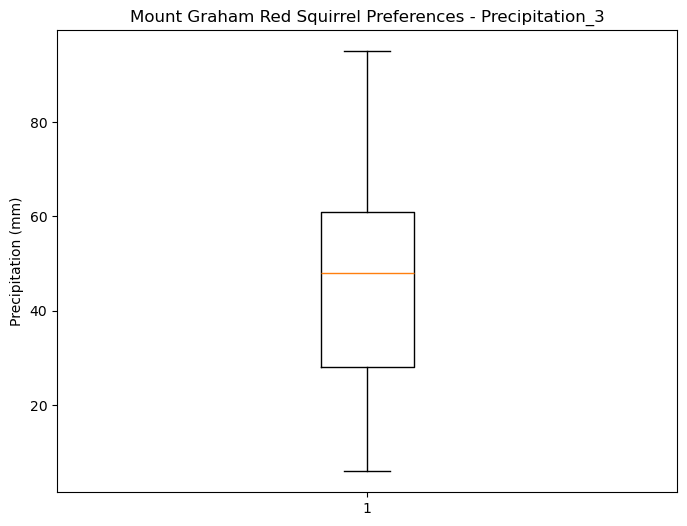

Mean: 46.4038961038961
Standard deviation: 18.952743403958888



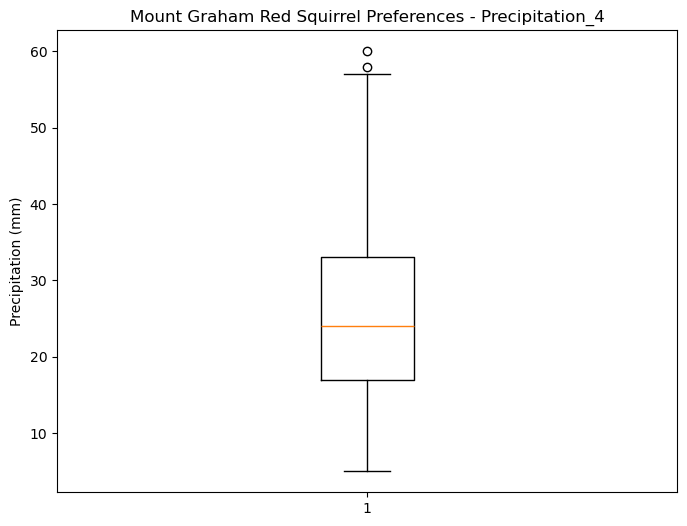

Mean: 25.571428571428573
Standard deviation: 10.952408799741818



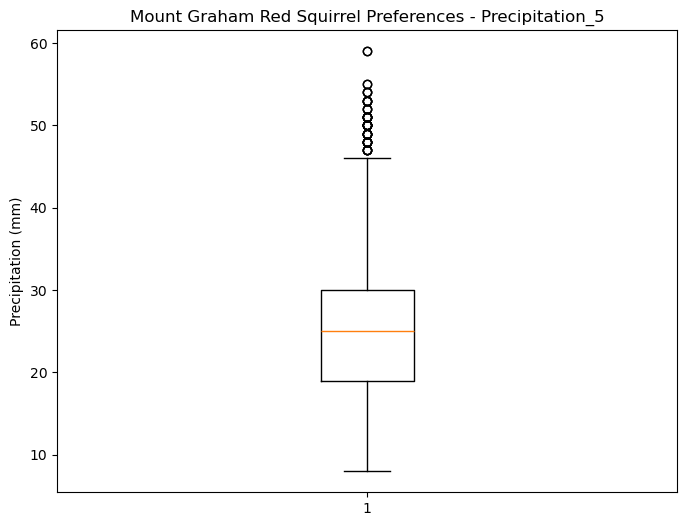

Mean: 25.942207792207792
Standard deviation: 9.018926618933321



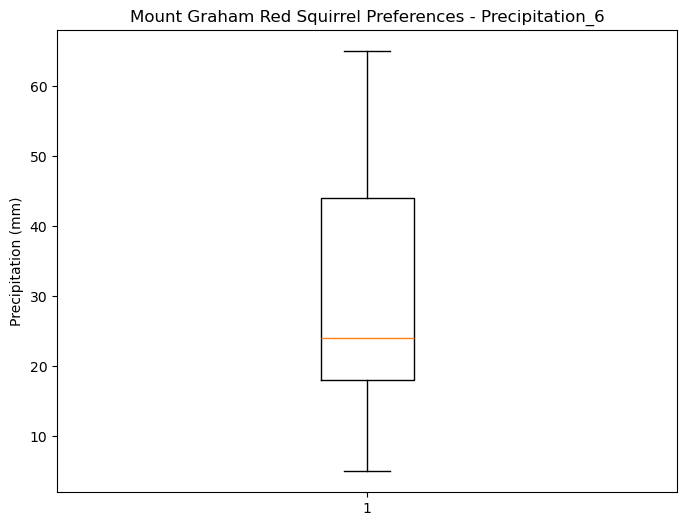

Mean: 30.293506493506495
Standard deviation: 14.178279498192744



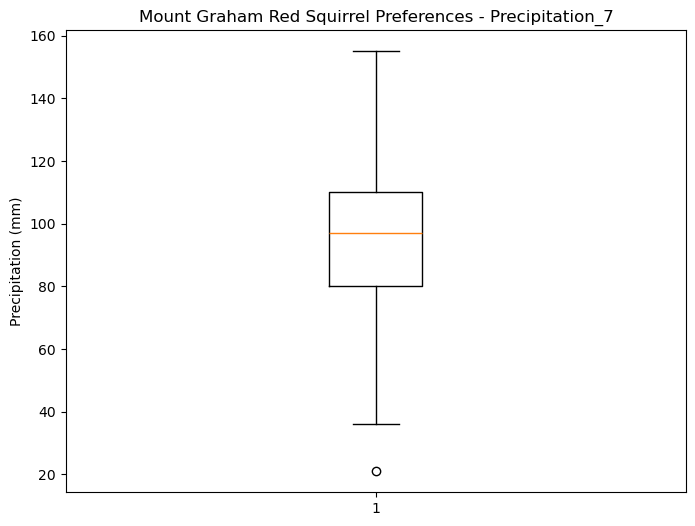

Mean: 93.6396103896104
Standard deviation: 21.66783598233559



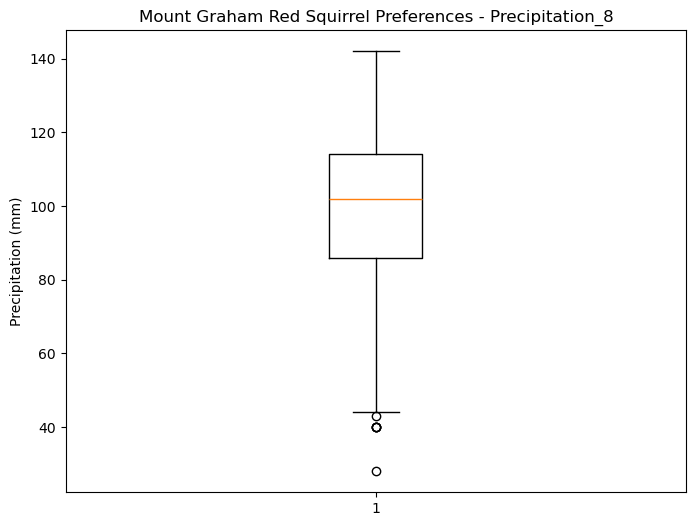

Mean: 99.29805194805195
Standard deviation: 20.402196911796263



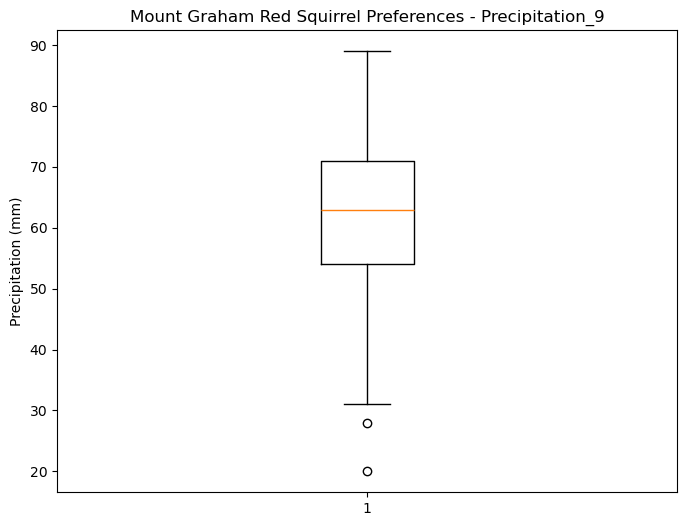

Mean: 62.16038961038961
Standard deviation: 13.556163915172267



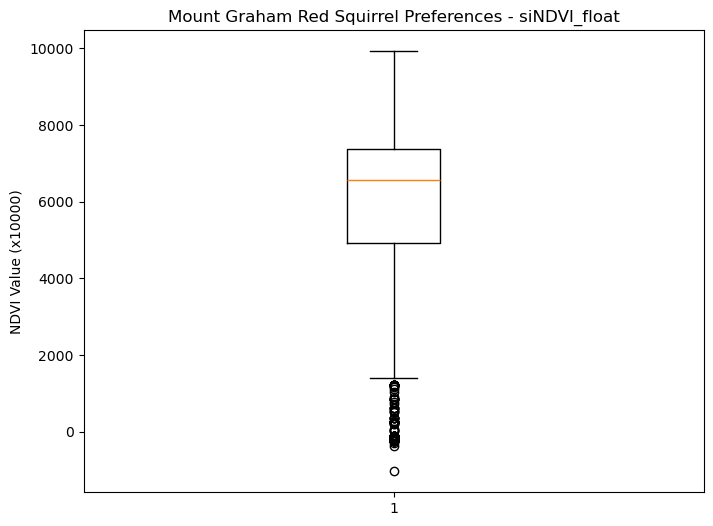

Mean: 5817.557142857143
Standard deviation: 2393.9937253669746



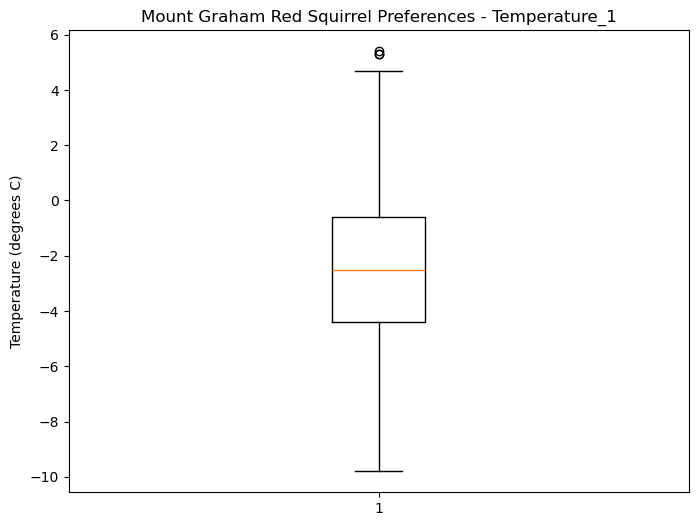

Mean: -2.600259737239836
Standard deviation: 2.4264515697344065



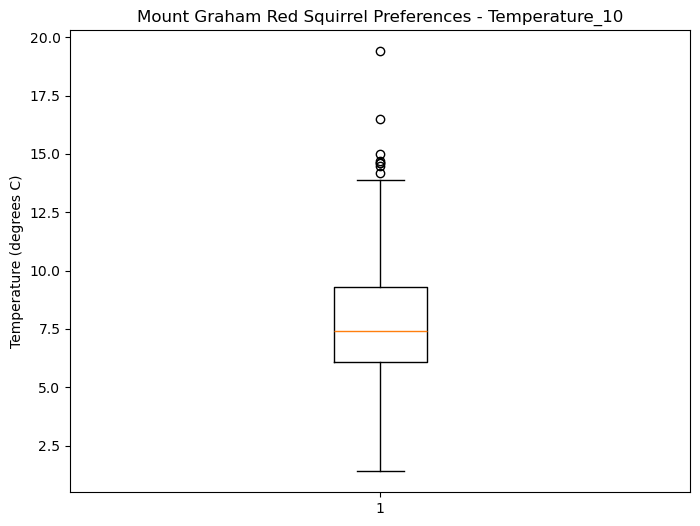

Mean: 7.675714311893884
Standard deviation: 2.243652776128513



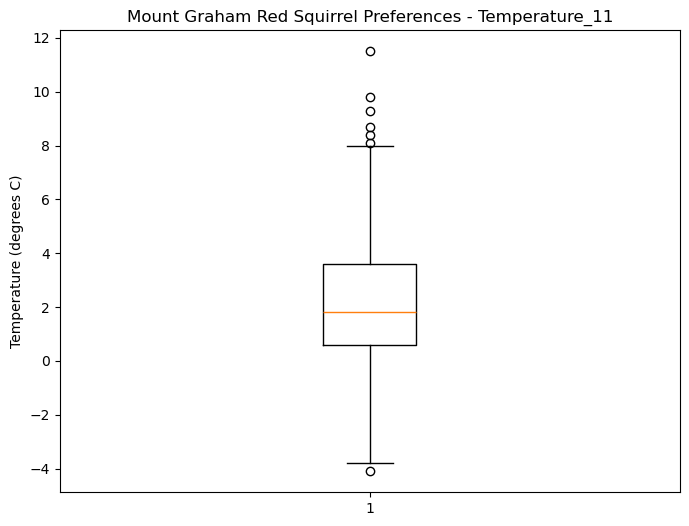

Mean: 1.9473376560182154
Standard deviation: 2.1247694620070607



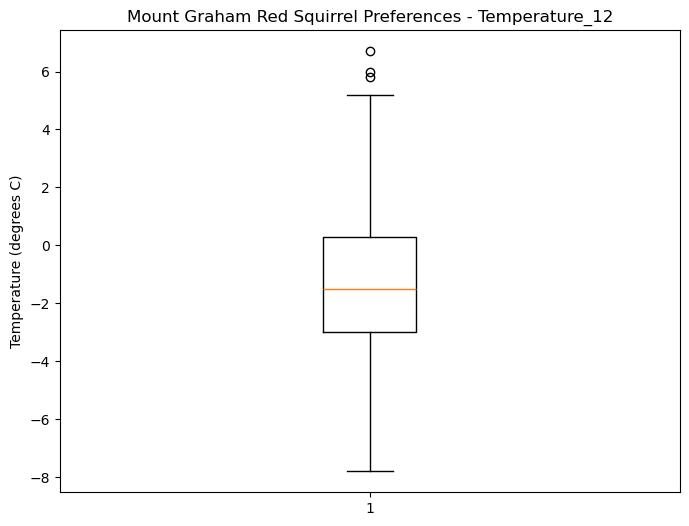

Mean: -1.5011038996521142
Standard deviation: 2.1786709197371854



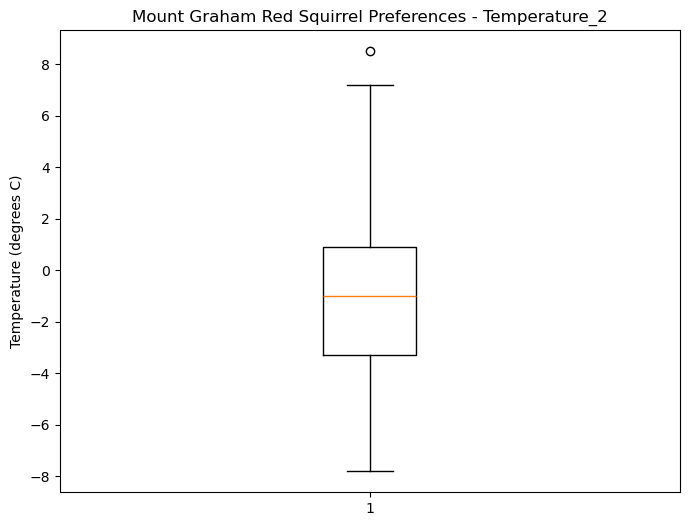

Mean: -1.2124025970552261
Standard deviation: 2.630252485985345



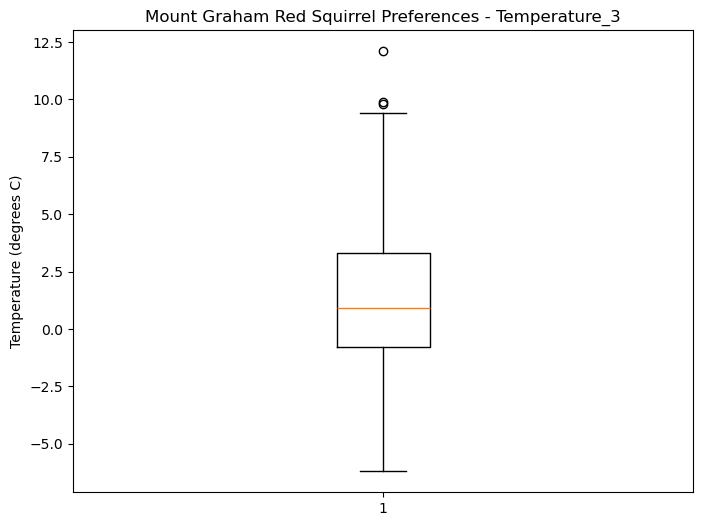

Mean: 0.9938961109702851
Standard deviation: 2.8079626185447117



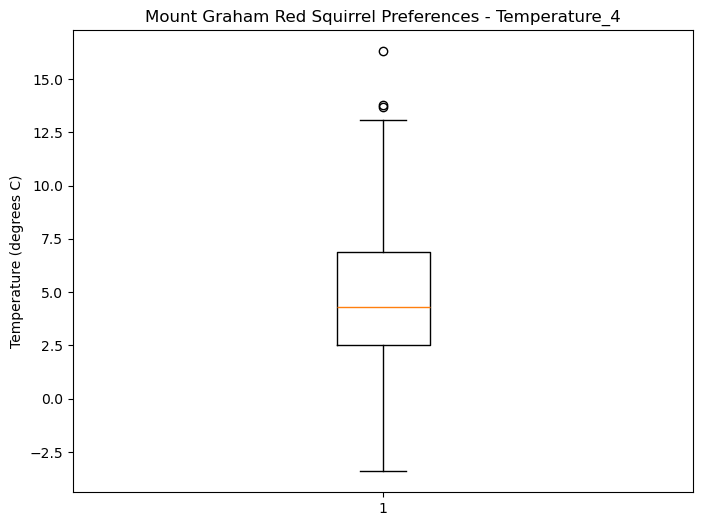

Mean: 4.3575324758355105
Standard deviation: 2.9895597673496614



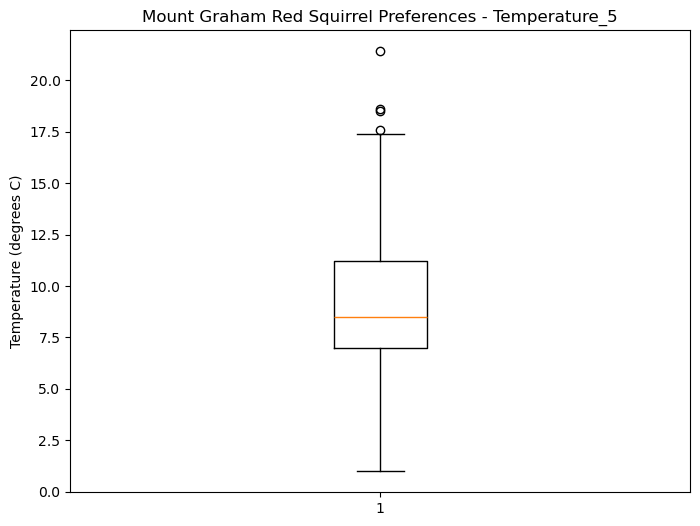

Mean: 8.792662332352105
Standard deviation: 2.9326672988324085



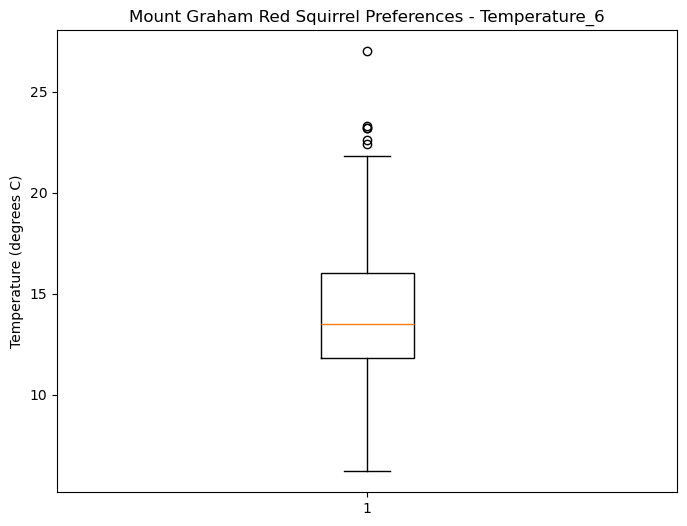

Mean: 13.701168848941853
Standard deviation: 2.886629539646278



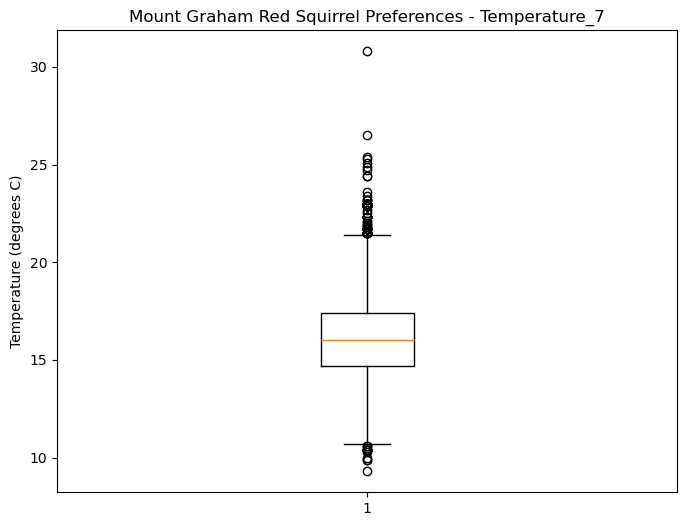

Mean: 16.248506530538783
Standard deviation: 2.5151480073024737



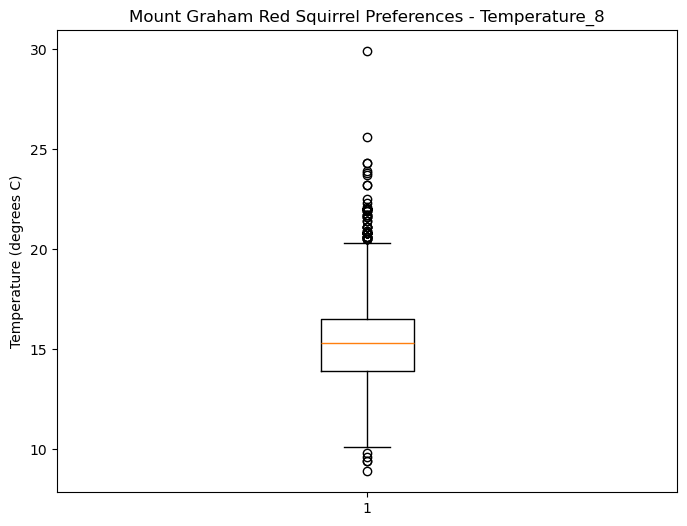

Mean: 15.495324656251189
Standard deviation: 2.4075830935892606



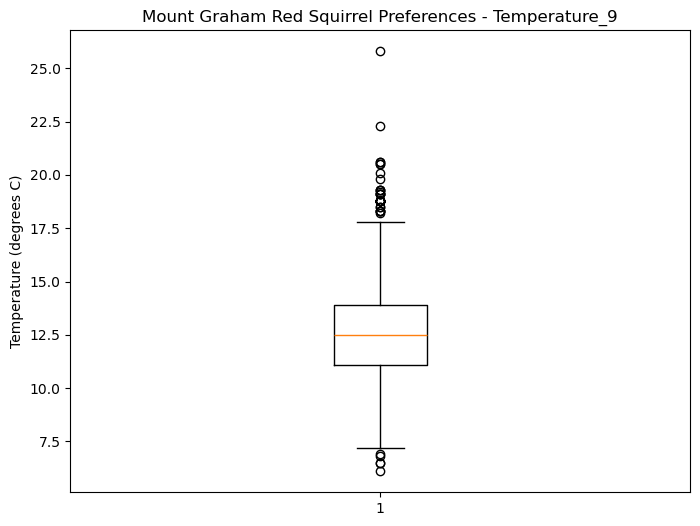

Mean: 12.653506483660117
Standard deviation: 2.3656891554377584



In [23]:
red_squirrel_listDict = findPrefs(red_squirrel,rastList,'Mount Graham Red Squirrel')

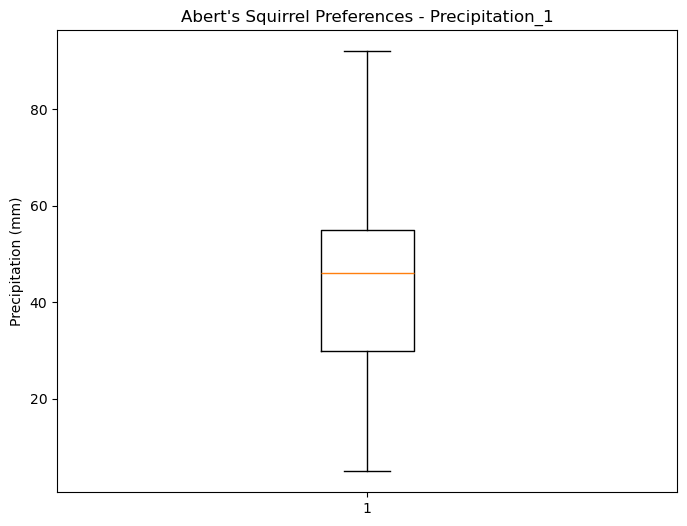

Mean: 43.60245035910435
Standard deviation: 15.236968793036397



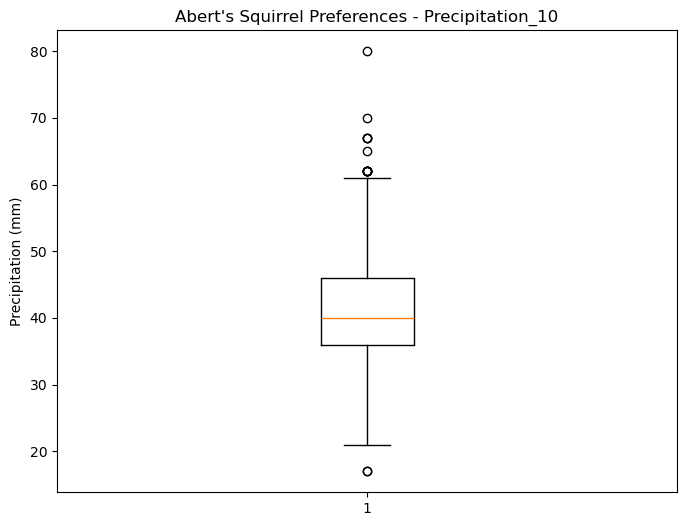

Mean: 41.507815800591466
Standard deviation: 8.442526228308434



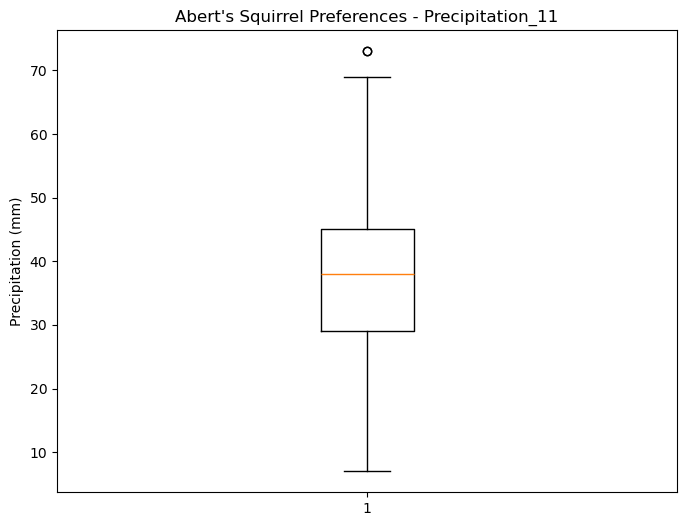

Mean: 36.93958597380651
Standard deviation: 10.816817171672184



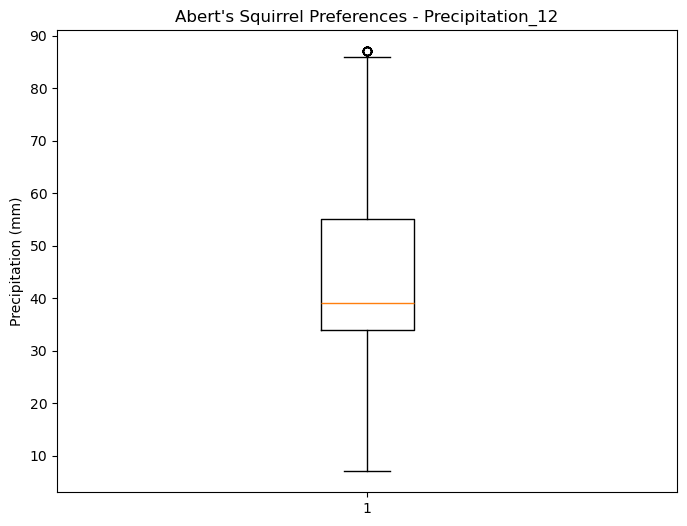

Mean: 44.373891001267424
Standard deviation: 17.601848372546733



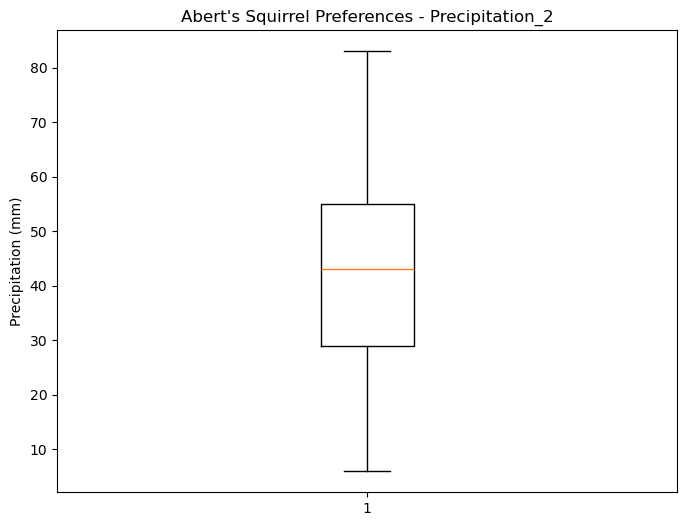

Mean: 41.02365863962822
Standard deviation: 15.155696254499702



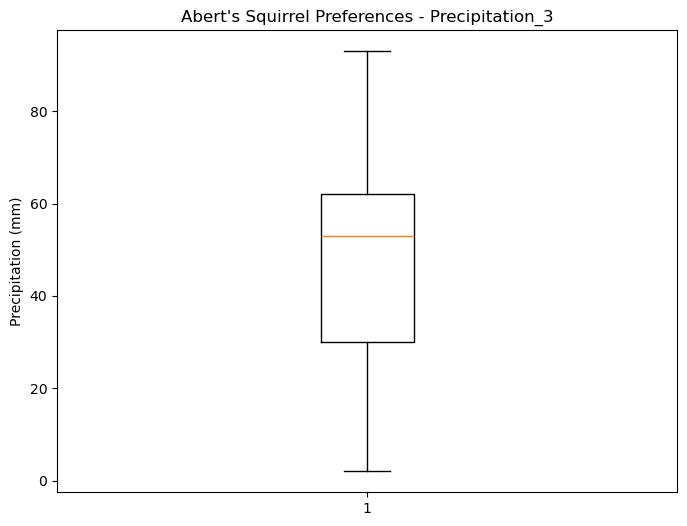

Mean: 45.985213350232364
Standard deviation: 19.01768188303325



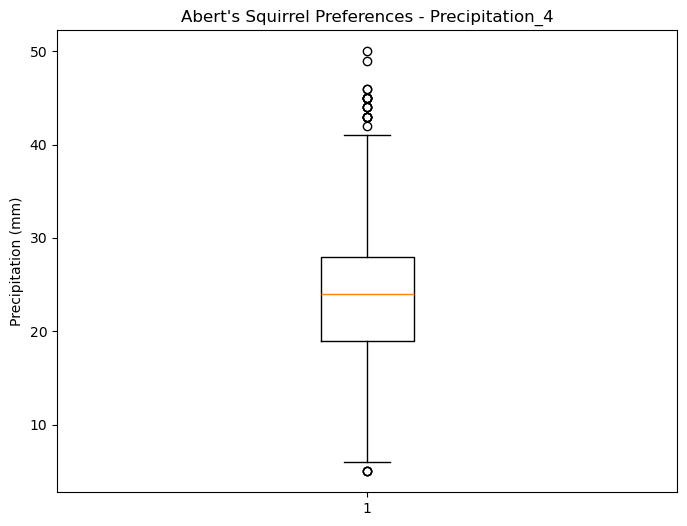

Mean: 22.972961554710604
Standard deviation: 7.695116782127185



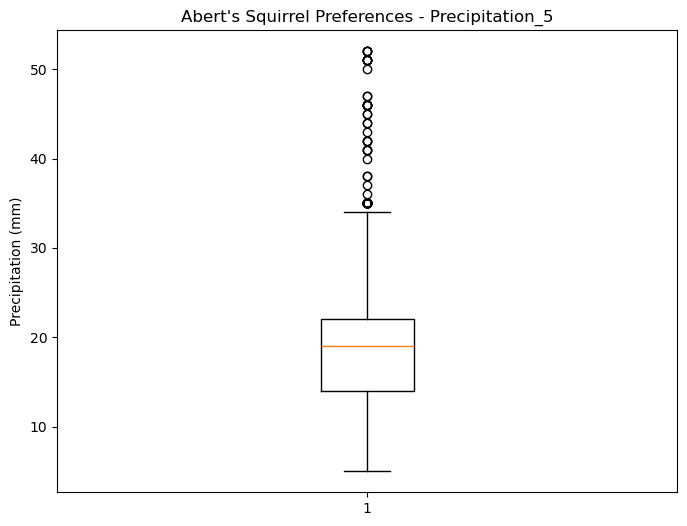

Mean: 19.357836924376848
Standard deviation: 6.769290463181252



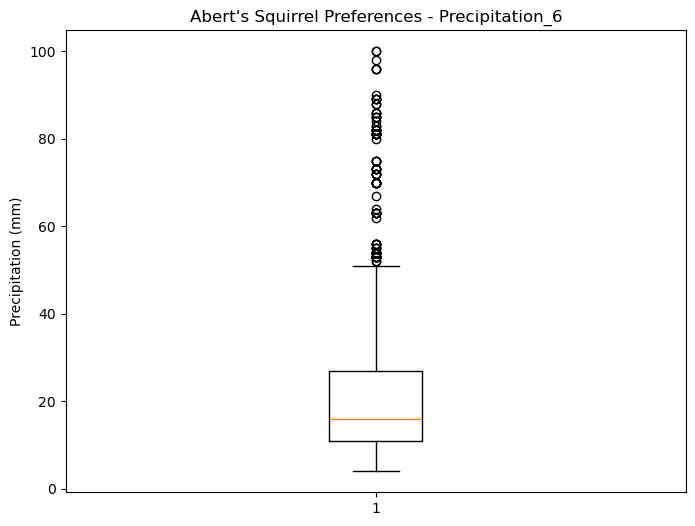

Mean: 21.841149133924798
Standard deviation: 14.725643558855637



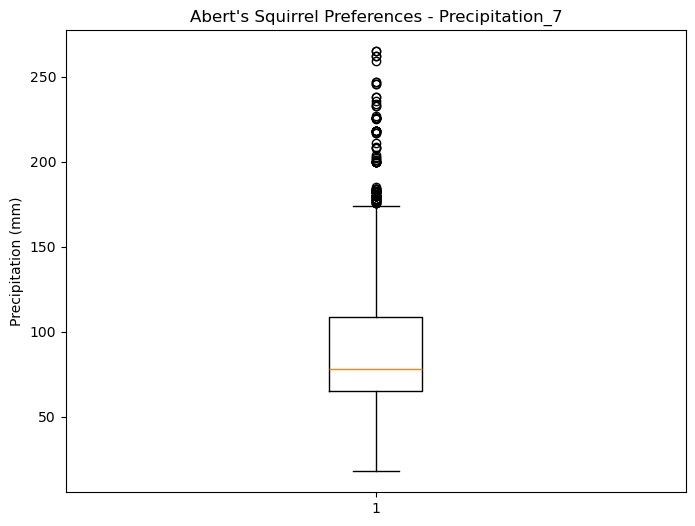

Mean: 89.17912970004225
Standard deviation: 37.03969706272429



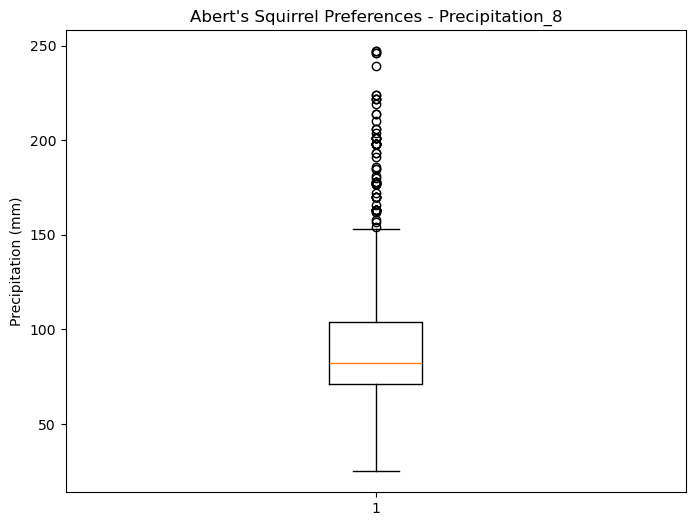

Mean: 90.65906210392902
Standard deviation: 29.786318910150506



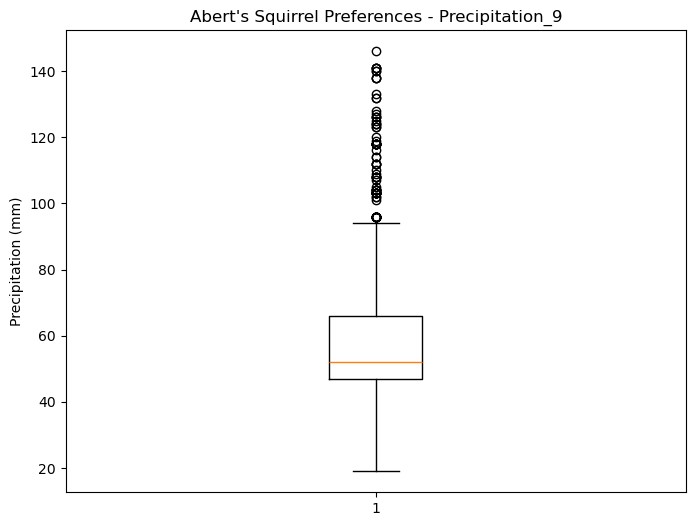

Mean: 56.34178284748627
Standard deviation: 17.454862664382464



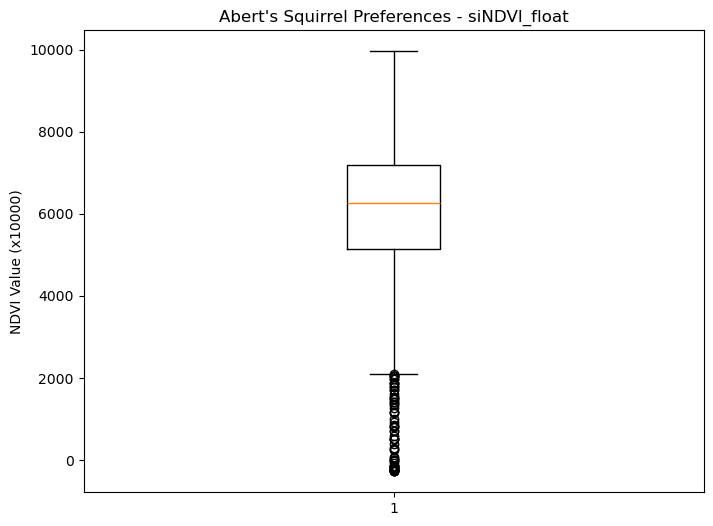

Mean: 5988.485002112378
Standard deviation: 1763.6814307063555



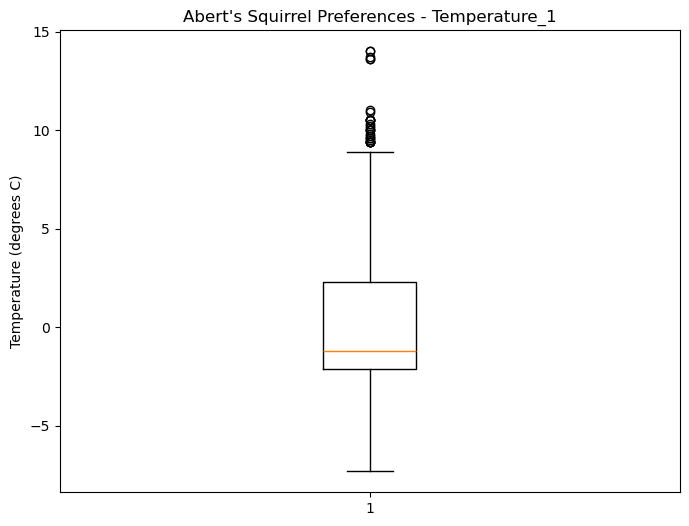

Mean: -0.08783269711987701
Standard deviation: 3.0569661537472044



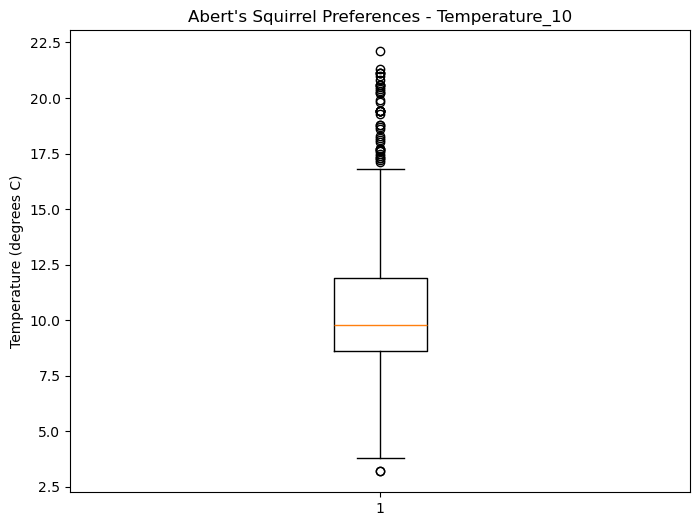

Mean: 10.264047304184869
Standard deviation: 2.554555232173129



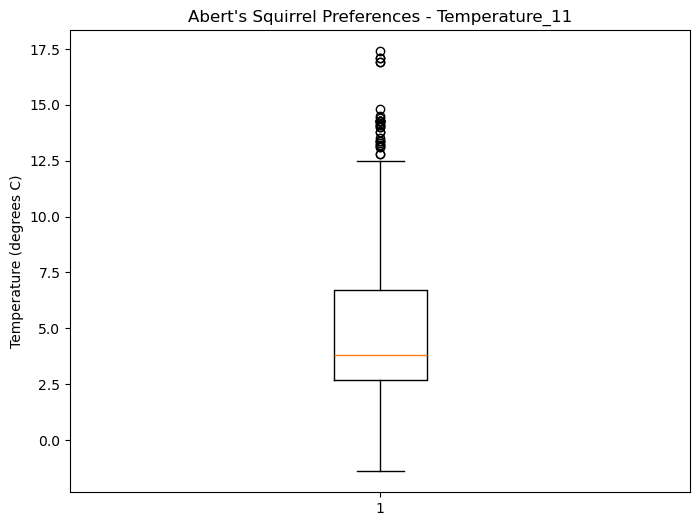

Mean: 4.58500209745975
Standard deviation: 2.7776838056448714



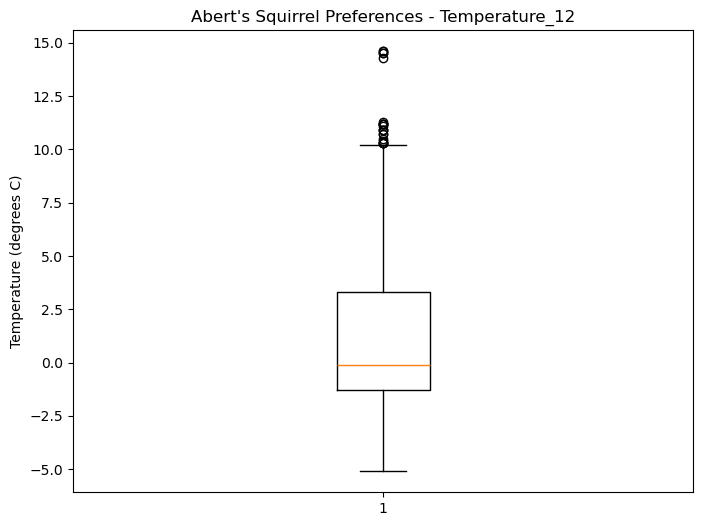

Mean: 0.7980143641451013
Standard deviation: 3.006560917497517



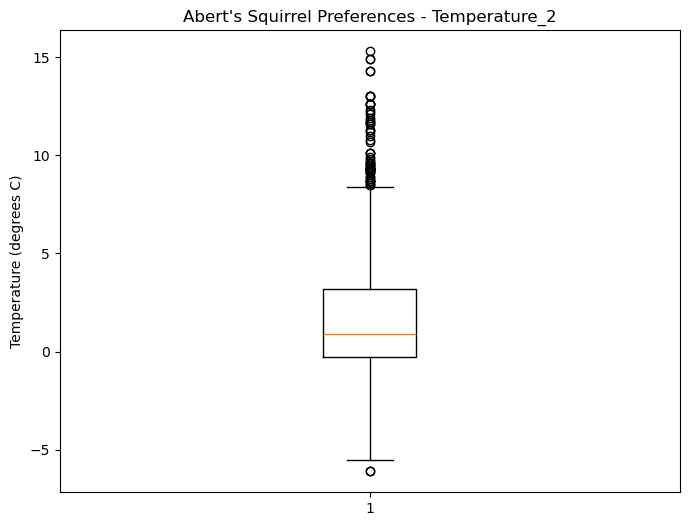

Mean: 1.466286432679489
Standard deviation: 2.9241184958852573



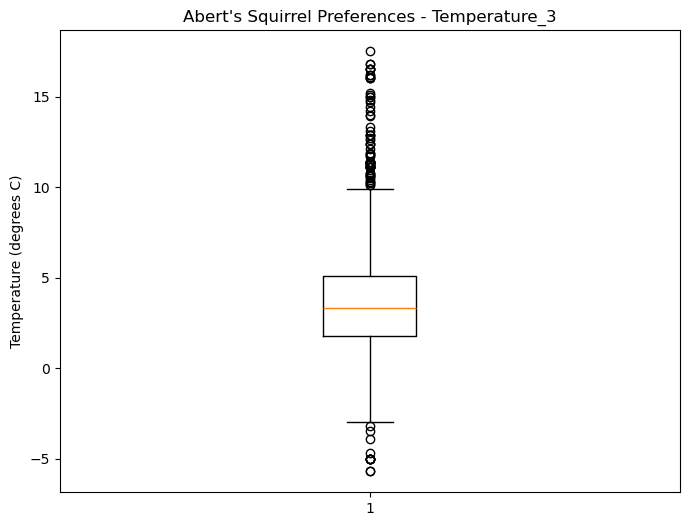

Mean: 3.643895227183483
Standard deviation: 2.852171343792404



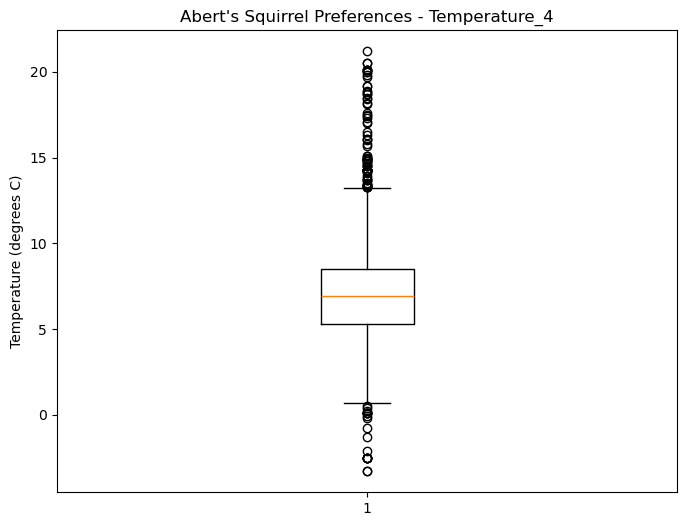

Mean: 7.095310524439681
Standard deviation: 2.9092136471740635



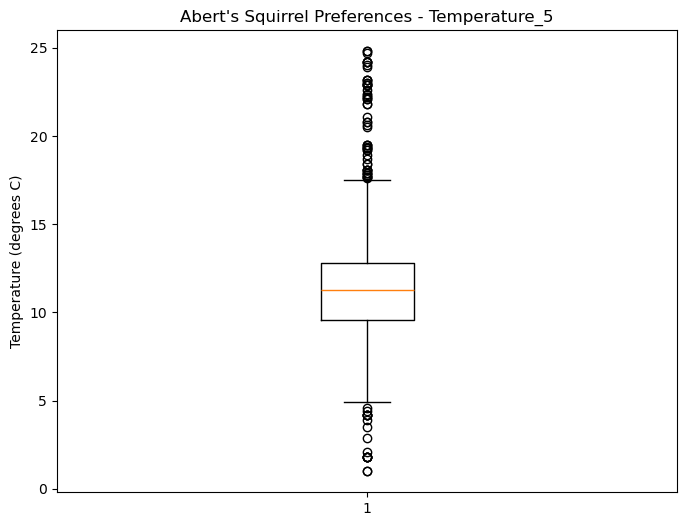

Mean: 11.4278411542911
Standard deviation: 2.7895511494341196



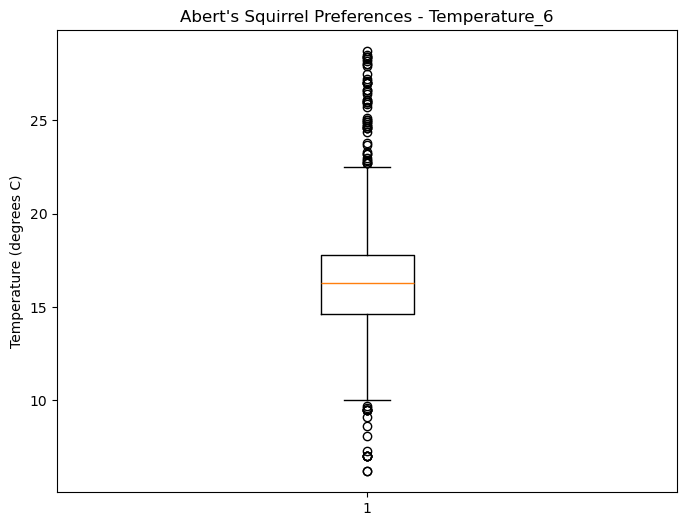

Mean: 16.38136884740097
Standard deviation: 2.6931998769775425



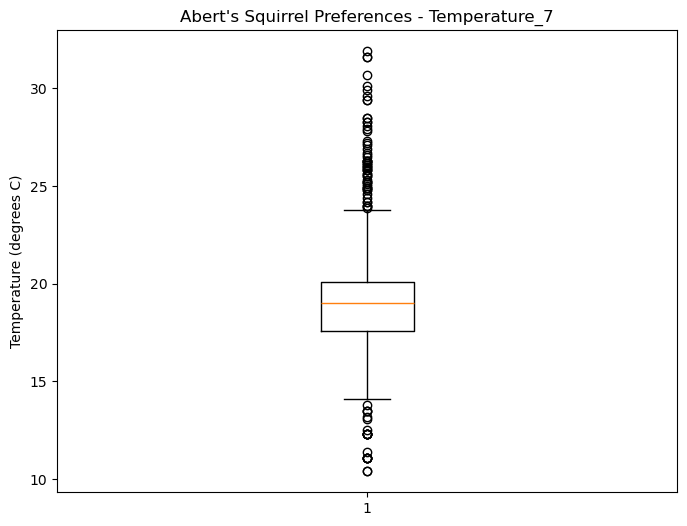

Mean: 19.012885507471612
Standard deviation: 2.2850498258311096



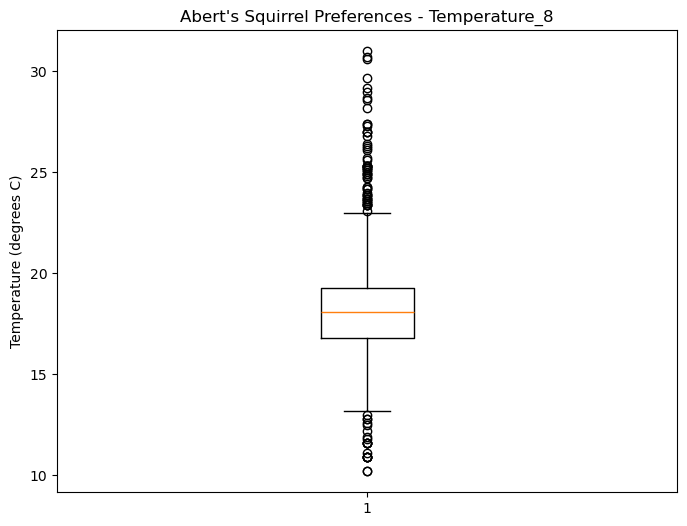

Mean: 18.174017753891164
Standard deviation: 2.2086926044569526



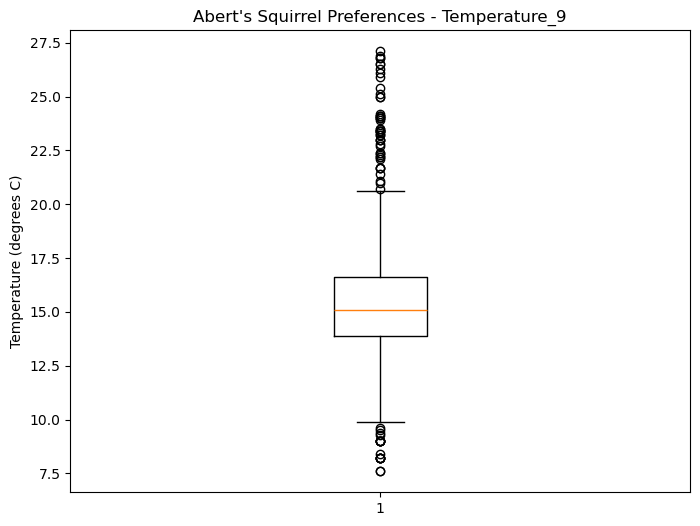

Mean: 15.350274602118857
Standard deviation: 2.3657314228667223



In [155]:
aberts_listDict = findPrefs(aberts,rastList,"Abert's Squirrel")

In [26]:
# Create empty precipitation and temperature list
precList = []
tempList = []
ndviList = []

# Create a nested list of all of the monthly precipitation and temperature rasters
for key in red_squirrel_listDict:

    # If the raster is illustrating precipitation
    if key[0] == 'P':

        # Add the list to the precList
        precList.append(red_squirrel_listDict[str(key)])

    # If the raster is illustrating temperature
    elif key[0] == 'T':

        # Add the list to the tempList
        tempList.append(red_squirrel_listDict[str(key)])

    # Else (NDVI raster)
    elif key[0] == 's':

        # Iterate through each value in the ndvi preference list
        for val in red_squirrel_listDict[key]:
        
            # Append to ndviList
            ndviList.append(val)

In [42]:
print(tempList)

[[-5.400000095367432, -6.5, -7.699999809265137, -8.100000381469727, -8.100000381469727, -5.300000190734863, -5.300000190734863, -5.400000095367432, -5.400000095367432, -6.699999809265137, -6.699999809265137, -4.900000095367432, -4.900000095367432, -4.900000095367432, -4.900000095367432, -4.900000095367432, -4.699999809265137, -4.699999809265137, -5.199999809265137, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -5.5, -4.800000190734863, -6.5, -4.099999904632568, -5.900000095367432, -5.900000095367432, -5.900000095367432, -7.699999809265137, -7.699999809265137, -6.300000190734863, -1.2999999523162842, -2.4000000953674316, -5.699999809265137, -5.599999904632568, -5.300000190734863, -5.099999904632568, -6.300000190734863, -8.199999809265137, -7.699999809265137, -8.199999809265137, -7.699999809265137, -2.5999999046325684, -8.100000381469727, -7.900000095367432, -7.900000095367432, -8.100000381469727, -7.900000095367432, -7.699999809265137, -7.699999809265137, -7.80

## Create Histograms

In [43]:
# Define a function to create histograms
def createHistogram(data,histogram_title):
    
    # Create histogram for the data itself
    plt.hist(data, bins=10, edgecolor='black', alpha=0.5)

    # Plot the histogram
    plt.title(histogram_title)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
        
    # Show the plot
    plt.show()

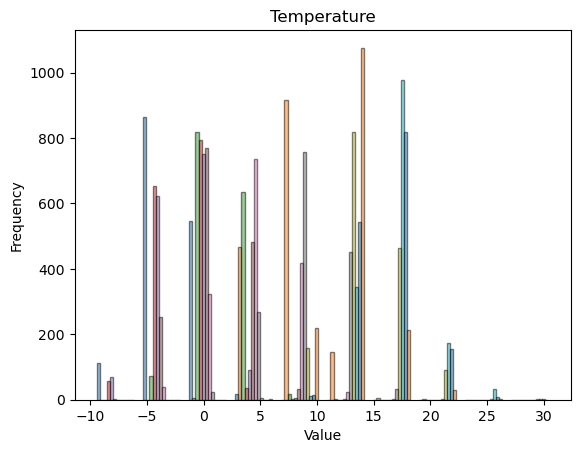

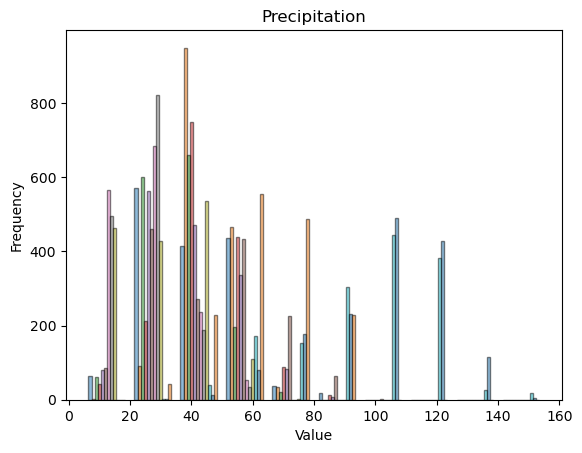

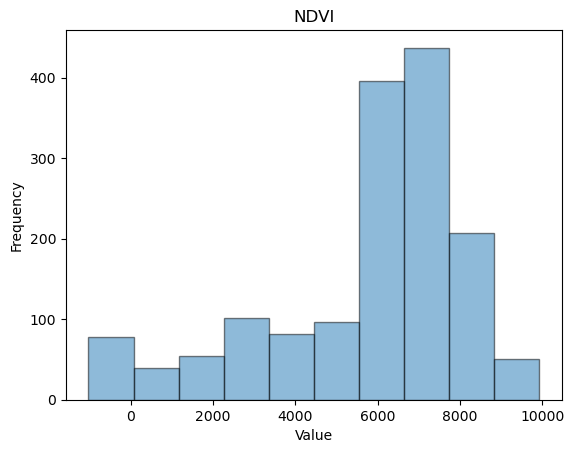

In [44]:
# Create histograms
createHistogram(tempList, 'Temperature')
createHistogram(precList, 'Precipitation')
createHistogram(ndviList, 'NDVI')

## Create Ponderosa Pine polygon through indicator kriging (>50% chance of Ponderosa Pine)

## Setup the Model

## With Parallelism

In [162]:
'''
# Define a function outside of the IBM to safely sample a raster at a location
def safe_sample(raster, location):

    # If the location is within the bounds of the raster
    if raster.bounds.left <= location[0] <= raster.bounds.right and raster.bounds.bottom <= location[1] <= raster.bounds.top:

        # Set variable equal to the raster cell's value
        value = list(raster.sample([location]))[0][0]

        # Return the value if it is not None
        if value is not None:

            # Return value
            return value

        # Otherwise, return None
        if value is None:

            # Return none
            return None

# Define the Individual class for species
class Individual:

    # Initiate Individual class with x and y values and define the alive function as "alive" because it is an original occurrence
    def __init__(self, age, position, tempKDEs, precKDEs, ndviKDE, temp_range=1, precip_range=25, ndvi_range=250):
        self.age = age
        self.position = position
        self.alive = True

        # Sample initial preferences for this individual and add randomness
        self.tempPref = self._sample_monthly_prefs(tempKDEs, temp_range)
        self.precipPref = self._sample_monthly_prefs(precKDEs, precip_range)
        self.ndviPref = self._sample_pref(ndviKDE, ndvi_range)
        
    # Helper function to sample preference from KDE and create a range around it
    def _sample_monthly_prefs(self, inKDE, range_value):

        # Create an empty list to add monthly preferences to
        monthlyPrefs = []
    
        # Iterate through each month
        for kde in inKDE:
        
            # Set initial preference and add randomness
            initial_pref = kde.sample()[0][0]
    
            # Append the range of preferences and add randomness
            monthlyPrefs.append((initial_pref - range_value, initial_pref + range_value))
    
        # Return the monthlyPrefs list
        return monthlyPrefs

    # Helper function to sample preference from annual data
    def _sample_pref(self, inKDE, range_value):
        
        # Set initial preference
        initial_pref = inKDE.sample()[0][0]

        # Return range of preferences and add randomness
        return (initial_pref - range_value, initial_pref + range_value)

    # Determine if individual is alive
    def is_alive(self):
        return self.alive

    # Function to age the individual annually
    def grow_older(self):
        self.age += 1
    
    # Method to determine if the individual dies
    def check_death(self, avgLifespan, popSize, carryingCap, infantMort):

        # Create a random value and check if number is less and self.alive is false
        deathProb = self.death_prob(self.age, avgLifespan, popSize, carryingCap, infantMort)

        # If the random number is less than the death probability
        if np.random.random() <= deathProb:
            self.alive = False

    # Define a function that kills off more indivduals after the average lifespan
    def death_prob(self, age, avgLifespan, popSize, carryingCap, infantMort):

        # Set a base death probability which increases as it approaches the carrying capacity
        base_death_prob = 1 / (1 + np.exp(-0.6 * (age - avgLifespan)))

        # Add some randomness
        base_death_prob = base_death_prob + random.uniform((base_death_prob * -1),base_death_prob)

        # If the individual is a newborn, the death rate equal the infant mortality rate
        if age < 1:

            # Return infant mortality with some randomness
            return infantMort + random.uniform((infantMort - 1),(1 - infantMort))

        # If the individual is older than 0, set values equal to the competition factor
        else:

            # If the population is greater than the carrying capacity
            if popSize > carryingCap:

                # Set a variable that holds a higher death rate for more competition
                adj_death_prob = base_death_prob * (2 * ((popSize / carryingCap) ** 2))
        
                # Return the adjusted death probability with some randomness
                return adj_death_prob + random.uniform((adj_death_prob * -1), adj_death_prob)
    
            # If population size <= carrying capacity, make the output just the original base death probability
            else:

                # Set a variable that holds a lower death rate for less competition
                adj_death_prob = base_death_prob * (2 * ((popSize / carryingCap) ** 0.1))
                
                # Set a lower death rate for less competition
                return adj_death_prob + random.uniform((adj_death_prob * -1), adj_death_prob)
    
    # Get new locations to create a new GDF
    def get_location(self):
        return Point(self.position)

    # Function to move points to raster cell with higher values
    def _move_to_higher_weight(self, precipRasters, tempRasters, ndviRaster, maxMove = 0.01):

        # Sample monthly raster values at the current location, using safe_sample
        precip_vals = [safe_sample(precipRaster, self.position) for precipRaster in precipRasters]
        temp_vals = [safe_sample(tempRaster, self.position) for tempRaster in tempRasters]
        ndvi_val = safe_sample(ndviRaster, self.position)  # Assume NDVI is annual
        ponderosa_val = safe_sample(ponderosaRaster, self.position)

        # Filter out None values in case some samples were out of bounds
        precip_vals = [val for val in precip_vals if val is not None]
        temp_vals = [val for val in temp_vals if val is not None]
            
        # Ensure that we have valid values for all monthly samples
        if not precip_vals or not temp_vals or ndvi_val is None or ponderosa_val is None:
                
            # Handle cases where data is missing; choose to skip moving or set default behavior
            return  # Exit the function if no valid data is found
    
        # Calculate differences between current values and preferences
        precip_diff = abs(np.mean(precip_vals) - np.mean([np.mean(r) for r in self.precipPref]))
        temp_diff = abs(np.mean(temp_vals) - np.mean([np.mean(r) for r in self.tempPref]))
        ndvi_diff = abs(ndvi_val - np.mean(self.ndviPref))

        # Weight the different environmental variables
        weightedNDVI = ndvi_diff
        weightedPrec = np.multiply(precip_diff, 2)
        weightedTemp = np.multiply(temp_diff, 2)

        # Calculate ponderosa pine attraction factor
        ponderosa_attraction = ponderosa_weight if ponderosa_val == 1 else 0
    
        # Calculate movement direction weighted by the inverse of the difference
        total_diff = weightedPrec + weightedTemp + weightedNDVI + ponderosa_attraction

        # If the difference between the mean of cell each point is on and the mean for each raster is greater than 0
        if total_diff > 0:

            # Move point based on distribution of raster cell values and the user-defined maximum distance
            move_x = (weightedPrec / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedTemp / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedNDVI / total_diff * np.random.uniform(-maxMove, maxMove) +
                    ponderosa_attraction / total_diff * np.random.uniform(-maxMove, maxMove))
    
            move_y = (weightedPrec / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedTemp / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedNDVI / total_diff * np.random.uniform(-maxMove, maxMove) +
                    ponderosa_attraction / total_diff * np.random.uniform(-maxMove, maxMove))

            # Add randomness to the movement
            driftX = np.random.uniform(-0.01,0.01)
            driftY = np.random.uniform(-0.01,0.01)

            # Move by the move_x and move_y variables
            x, y = (move_x + self.position[0] + driftX, move_y + self.position[1] + driftY)
            
        # Update the individual's position
        self.position = (x, y)

# Create a function for the population model
class popModel:

    # Initiate a function for finding the population size
    def __init__(self, speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRaster, species_temp_prefs, species_precip_prefs, species_ndvi_prefs):

        # Intialize the GDF
        self.speciesData = speciesData

        # Initialize temperature prefs
        self.species_temp_prefs = species_temp_prefs

        # Initialize precipitation prefs
        self.species_precip_prefs = species_precip_prefs

        # Initialize temperature prefs
        self.species_ndvi_prefs = species_ndvi_prefs

        # Initialize carrying capacity
        self.carryingCap = carryingCap

        # Initialize the annual birth rate
        self.birthRate = birthRate

        # Initialize average number of births per birth
        self.avgBirths = avgBirths

        # Intialize maximum possible number of births
        self.maxBirths = maxBirths

        # Initialize the average lifespan of the species
        self.avgLifespan = avgLifespan

        # Initialize maximum age
        self.maxAge = maxAge

        # Initialize infant mortality
        self.infantMort = infantMort

        # Initialize precipitation raster
        self.precipRaster = precipRasters

        # Initialize temperature raster
        self.tempRaster = tempRasters

        # Initialize NDVI raster
        self.ndviRaster = ndviRaster

        # Initialize temperature prefs
        self.tempKDEs = tempKDEs

        # Initialize precipitation prefs
        self.precKDEs = precKDEs

        # Initialize temperature prefs
        self.ndviKDE = ndviKDE

        # Initialize an empty list to add the change in population size over time
        self.pop_over_time = []

        # Initialize timesteps
        self.timeSteps = 0

        # Initialize the population
        self.individuals = self.initPop(speciesData, avgLifespan, maxAge)

    # Initialize population
    def initPop(self, speciesData, avgLifespan, maxAge):

        # Find the lower and upper ends of 50% of the population
        lower = math.floor(0 * maxAge)
        upper = math.ceil(0.65 * maxAge)

        # Calculate mean and standard deviation within the interquartile range
        meanAge = avgLifespan * 0.1 + random.uniform(((avgLifespan * 0.1) * -1),(avgLifespan * 0.1))
        stdDev = (upper - lower) / 2

        # Create a numpy array with ages with distribution created above
        ages = np.random.normal(meanAge, stdDev, len(speciesData))

        # Round all of the ages to the nearest one
        ages = np.round(ages)

        # Make sure all ages are less than or equal to the max age
        ages = np.clip(ages, 0, maxAge)

        # Extract points from GDF
        points = speciesData.geometry.apply(lambda geom: (geom.x, geom.y)).values

        # Assign random coordinates to each point in the GDF
        positions = np.random.choice(points, size = len(speciesData))

        # Return the ages and locations for each individual
        return [Individual(age, pos, self.tempKDEs, self.precKDEs, self.ndviKDE) for age, pos in zip(ages, positions)]

    # Create a function to perform multiprocessing
    def processInd(individual, avgLifespan, popSize, carryingCap, infantMort, precipRaster, tempRaster, ndviRaster, maxAge):

        # If the individual is alive
        if individual.alive:

            # Check if individual is dead
            individual.check_death(self.avgLifespan, popSize, self.carryingCap, self.infantMort)

            # If the inidividual is still alive after a year
            if individual.alive:

                # Age the individual by a year
                individual.grow_older()

                # Remove any individuals who are now older than the maximum age
                if individual.age <= self.maxAge:

                    # Return the individual
                    return individual

        # Return None to be safe if individual does not exist
        return None

    # Define a function to move individuals in parallel
    def parallelMove(individual, precipRaster, tempRaster, ndviRaster):

        # Perform _move_to_higher_weight function
        individual._move_to_higher_weight(precipRaster, tempRaster, ndviRaster)

        # Return individual with updated location
        return individual
    
    # Create code to simulate a year
    def yearSim(self):

        # Set variable with the population size
        popSize = len(self.individuals)

        # Use parallel processing to perform the process_individuals function
        with Pool() as pool:

            # Set a variable for the survivors after executing process_individuals function
            survivors = pool.starmap(
                processInd,
                [(ind, self.avgLifespan, popSize, self.carryingCap, self.infantMort,
                  self.precipRaster, self.tempRaster, self.ndviRaster, self.maxAge) for ind in self.individuals]
            )

        # Create a list of survivors
        survivors = [ind for ind in survivors if ind is not None]

        # Run the movement of individuals in parallel
        with Pool() as pool:

            # Set the individuals to the moved individuals
            self.individuals = pool.starmap(
                parallelMove,
                [(ind, self.precipRaster, self.tempRaster, self.ndviRaster) for ind in survivors]
            )
        
        # Calculate the new births based on birth rate
        newBirths = self.addBirths(survivors, popSize)
    
        # Add the newBirths list to the survivors list
        survivors.extend(newBirths)
    
        # Set individuals to the new survivors of the last year
        self.individuals = survivors
    
        # Add time step
        self.timeSteps += 1
    
        # Add the population over time list
        self.pop_over_time.append(len(self.individuals))

    # Define a function to run add births in parallel
    def processBirth(parent, maxBirths, avgBirths, tempKDEs, precKDEs, ndviKDE, maxAge, avgLifespan, birthRate):

        # Create an empty to add the new individuals into
        newInds = []

        # For each survivor, calculate their individual birth probability based on age
        for parent in survivors:

            # Calculate the likelihood that the individual would give birth based on age 
            age_birth_prob = self.birthRate * (1 / (1 + np.exp(0.5 * (parent.age - self.maxAge))))

            # If the individual is in its prime, there is a better chance they give birth
            if parent.age < (self.avgLifespan * 0.75):

                # Add some randomness and skew it higher than the input birth probability (0.5 is used because a maximum of half the population can give birth)
                age_birth_prob = age_birth_prob + random.uniform(((age_birth_prob - 0.5) * 0.5),(0.5 - age_birth_prob))

            # For other ages, just add randomness with a normal distribution
            else:
                
                # Add randomness on a normal distribution
                age_birth_prob = age_birth_prob + random.uniform((age_birth_prob - 0.5),(0.5 - age_birth_prob))
    
            # If the parent gives birth, decide the number of offspring (based on existing logic)
            if age_birth_prob >= random.uniform(0,1):

                # Set a variable equal to the range of the number of births the individual could have
                possibleBirths = np.arange(1, self.maxBirths + 1)

                # Create weights based on the distribution of births per individual
                weights = np.exp(-0.5 * (possibleBirths - self.avgBirths) ** 2)

                # Normalize
                weights /= np.sum(weights)

                # Find number of births for this individual
                numBirths = np.random.choice(possibleBirths, p=weights)

                # Iterate for each birth
                for _ in range(numBirths):

                    # Create a new individual which starts at the parent's location at the age of 0
                    newInd = Individual(
                        age=0, 
                        position=parent.position, 
                        tempKDEs=self.tempKDEs,
                        precKDEs=self.precKDEs,
                        ndviKDE=self.ndviKDE
                    )

                    # Append the new individual to the new individuals list
                    newInds.append(newInd)
    
        return newInds
    
    # Define a function for adding births at a parent's location
    def addBirths(self, survivors, popSize):
        
        # Pool the function and run in parallel
        with Pool() as pool:

            # Set a variable for the results of adding births
            results = pool.starmap(
                processBirth,
                [(parent, self.maxBirths, self.avgBirths, self.tempKDEs, self.precKDEs, self.ndviKDE,
                  self.maxAge, self.avgLifespan, self.birthRate) for parent in survivors]
            )

        # Flatten results
        newInds = [ind for sublist in results for ind in sublist]

        # Return new individuals
        return newInds

    def createGDF(self):

        # Create variable for alive individuals
        aliveInds = [ind for ind in self.individuals if ind.alive]

        # Create a variable for geometries
        geometry = [ind.get_location() for ind in aliveInds]

        # Create a variable for age
        age = [ind.age for ind in aliveInds]

        # Create geodataframe
        gdf = gpd.GeoDataFrame({'Age':age, 'Geometry':geometry})

        # Set the geometry to where the new point is
        gdf = gdf.set_geometry('Geometry')

        # Return GDF
        return gdf
'''

In [28]:
# Define a function outside of the IBM to safely sample a raster at a location
def safe_sample(raster, location):

    # If the location is within the bounds of the raster
    if raster.bounds.left <= location[0] <= raster.bounds.right and raster.bounds.bottom <= location[1] <= raster.bounds.top:

        # Set variable equal to the raster cell's value
        value = list(raster.sample([location]))[0][0]

        # Return the value if it is not None
        if value is not None:

            # Return value
            return value

        # Otherwise, return None
        if value is None:

            # Return none
            return None

# Define the Individual class for species
class Individual:

    # Initiate Individual class with x and y values and define the alive function as "alive" because it is an original occurrence
    def __init__(self, age, position, tempKDEs, precKDEs, ndviKDE, temp_range=1, precip_range=25, ndvi_range=500):
        self.age = age
        self.position = position
        self.alive = True

        # Sample initial preferences for this individual and add randomness
        self.initial_pref_temp, self.tempPref = self._sample_monthly_prefs(tempKDEs, temp_range)
        self.initial_pref_prec, self.precipPref = self._sample_monthly_prefs(precKDEs, precip_range)
        self.initial_pref_ndvi, self.ndviPref = self._sample_pref(ndviKDE, ndvi_range)
        
    # Helper function to sample preference from KDE and create a range around it
    def _sample_monthly_prefs(self, inKDE, range_value):

        # Create list for intial preferences
        initialPrefs = []

        # Create an empty list to add monthly preferences to
        monthlyPrefs = []
    
        # Iterate through each month
        for kde in inKDE:
        
            # Set initial preference and add randomness
            initial_pref = kde.sample()[0][0]

            # Append initial prefs
            initialPrefs.append(initial_pref)
    
            # Append the range of preferences and add randomness
            monthlyPrefs.append((initial_pref - range_value, initial_pref + range_value))
    
        # Return the monthlyPrefs list
        return initialPrefs, monthlyPrefs

    # Helper function to sample preference from annual data
    def _sample_pref(self, inKDE, range_value):
        
        # Set initial preference
        initial_pref = inKDE.sample()[0][0]

        # Return range of preferences and add randomness
        return (initial_pref - range_value, initial_pref + range_value)

    # Determine if individual is alive
    def is_alive(self):
        return self.alive

    # Function to age the individual annually
    def grow_older(self):
        self.age += 1
    
    # Method to determine if the individual dies
    def check_death(self, avgLifespan, popSize, carryingCap, infantMort):

        # Create a random value and check if number is less and self.alive is false
        deathProb = self.death_prob(self.age, avgLifespan, popSize, carryingCap, infantMort)

        # If the random number is less than the death probability
        if np.random.random() <= deathProb:
            self.alive = False

    # Define a function that kills off more indivduals after the average lifespan
    def death_prob(self, age, avgLifespan, popSize, carryingCap, infantMort):

        # Set a base death probability which increases as it approaches the carrying capacity
        base_death_prob = 1 / (1 + np.exp(-0.6 * (age - avgLifespan)))

        # Add some randomness
        base_death_prob = base_death_prob + random.uniform((base_death_prob * -1),base_death_prob)

        # If the individual is a newborn, the death rate equal the infant mortality rate
        if age < 1:

            # Return infant mortality with some randomness
            return infantMort + random.uniform((infantMort - 1),(1 - infantMort))

        # If the individual is older than 0, set values equal to the competition factor
        else:

            # If the population is greater than the carrying capacity
            if popSize > carryingCap:

                # Set a variable that holds a higher death rate for more competition
                adj_death_prob = base_death_prob * (2 * ((popSize / carryingCap) ** 2))
        
                # Return the adjusted death probability with some randomness
                return adj_death_prob + random.uniform((adj_death_prob * -1), adj_death_prob)
    
            # If population size <= carrying capacity, make the output just the original base death probability
            else:

                # Set a variable that holds a lower death rate for less competition
                adj_death_prob = base_death_prob * (2 * ((popSize / carryingCap) ** 0.1))
                
                # Set a lower death rate for less competition
                return adj_death_prob + random.uniform((adj_death_prob * -1), adj_death_prob)
    
    # Get new locations to create a new GDF
    def get_location(self):
        return Point(self.position)

    # Function to move points to raster cell with higher values
    def _move_to_higher_weight(self, precipRasters, tempRasters, ndviRaster, maxMove = 0.01):

        # Sample monthly raster values at the current location, using safe_sample
        precip_vals = [safe_sample(precipRaster, self.position) for precipRaster in precipRasters]
        temp_vals = [safe_sample(tempRaster, self.position) for tempRaster in tempRasters]
        ndvi_val = safe_sample(ndviRaster, self.position)  # Assume NDVI is annual

        # Filter out None values in case some samples were out of bounds
        precip_vals = [val for val in precip_vals if val is not None]
        temp_vals = [val for val in temp_vals if val is not None]
            
        # Ensure that we have valid values for all monthly samples
        if not precip_vals or not temp_vals or ndvi_val is None:
                
            # Handle cases where data is missing; choose to skip moving or set default behavior
            return  # Exit the function if no valid data is found
    
        # Calculate differences between current values and preferences
        precip_diff = abs(np.mean(precip_vals) - np.mean([np.mean(r) for r in self.precipPref]))
        temp_diff = abs(np.mean(temp_vals) - np.mean([np.mean(r) for r in self.tempPref]))
        ndvi_diff = abs(ndvi_val - np.mean(self.ndviPref))

        # Weight the different environmental variables
        weightedNDVI = ndvi_diff
        weightedPrec = np.multiply(precip_diff, 2)
        weightedTemp = np.multiply(temp_diff, 2)
    
        # Calculate movement direction weighted by the inverse of the difference
        total_diff = weightedPrec + weightedTemp + weightedNDVI

        # If the difference between the mean of cell each point is on and the mean for each raster is greater than 0
        if total_diff > 0:

            # Move point based on distribution of raster cell values and the user-defined maximum distance
            move_x = (weightedPrec / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedTemp / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedNDVI / total_diff * np.random.uniform(-maxMove, maxMove))
    
            move_y = (weightedPrec / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedTemp / total_diff * np.random.uniform(-maxMove, maxMove) +
                    weightedNDVI / total_diff * np.random.uniform(-maxMove, maxMove))

            # Add randomness to the movement
            driftX = np.random.uniform(-0.01,0.01)
            driftY = np.random.uniform(-0.01,0.01)

            # Move by the move_x and move_y variables
            x, y = (move_x + self.position[0] + driftX, move_y + self.position[1] + driftY)
            
        # Update the individual's position
        self.position = (x, y)

# Create a function for the population model
class popModel:

    # Initiate a function for finding the population size
    def __init__(self, speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRaster, species_temp_prefs, species_precip_prefs, species_ndvi_prefs):

        # Intialize the GDF
        self.speciesData = speciesData

        # Initialize temperature prefs
        self.species_temp_prefs = species_temp_prefs

        # Initialize precipitation prefs
        self.species_precip_prefs = species_precip_prefs

        # Initialize temperature prefs
        self.species_ndvi_prefs = species_ndvi_prefs

        # Initialize carrying capacity
        self.carryingCap = carryingCap

        # Initialize the annual birth rate
        self.birthRate = birthRate

        # Initialize average number of births per birth
        self.avgBirths = avgBirths

        # Intialize maximum possible number of births
        self.maxBirths = maxBirths

        # Initialize the average lifespan of the species
        self.avgLifespan = avgLifespan

        # Initialize maximum age
        self.maxAge = maxAge

        # Initialize infant mortality
        self.infantMort = infantMort

        # Initialize precipitation raster
        self.precipRaster = precipRasters

        # Initialize temperature raster
        self.tempRaster = tempRasters

        # Initialize NDVI raster
        self.ndviRaster = ndviRaster

        # Initialize temperature prefs
        self.tempKDEs = tempKDEs

        # Initialize precipitation prefs
        self.precKDEs = precKDEs

        # Initialize temperature prefs
        self.ndviKDE = ndviKDE

        # Initialize an empty list to add the change in population size over time
        self.pop_over_time = []

        # Initialize timesteps
        self.timeSteps = 0

        # Initialize the population
        self.individuals = self.initPop(speciesData, avgLifespan, maxAge)

    # Initialize population
    def initPop(self, speciesData, avgLifespan, maxAge):

        # Find the lower and upper ends of 50% of the population
        lower = math.floor(0 * maxAge)
        upper = math.ceil(0.65 * maxAge)

        # Calculate mean and standard deviation within the interquartile range
        meanAge = avgLifespan * 0.1 + random.uniform(((avgLifespan * 0.1) * -1),(avgLifespan * 0.1))
        stdDev = (upper - lower) / 2

        # Create a numpy array with ages with distribution created above
        ages = np.random.normal(meanAge, stdDev, len(speciesData))

        # Round all of the ages to the nearest one
        ages = np.round(ages)

        # Make sure all ages are less than or equal to the max age
        ages = np.clip(ages, 0, maxAge)

        # Extract points from GDF
        points = speciesData.geometry.apply(lambda geom: (geom.x, geom.y)).values

        # Assign random coordinates to each point in the GDF
        positions = np.random.choice(points, size = len(speciesData))

        # Return the ages and locations for each individual
        return [Individual(age, pos, self.tempKDEs, self.precKDEs, self.ndviKDE) for age, pos in zip(ages, positions)]

    # Create code to simulate a year
    def yearSim(self):

        # Create an empty list for the survivors of each year
        survivors = []

        # Set variable with the population size
        popSize = len(self.individuals)

        # Mave all individuals in the dataset
        for individual in self.individuals:

            # If the individual is alive
            if individual.alive:

                # Check if individual is dead
                individual.check_death(self.avgLifespan, popSize, self.carryingCap, self.infantMort)

                # If the inidividual is still alive after a year
                if individual.alive:

                    # Age the individual by a year
                    individual.grow_older()

                    # Move the individual
                    individual._move_to_higher_weight(self.precipRaster, self.tempRaster, self.ndviRaster)

                    # Remove any individuals who are now older than the maximum age
                    if individual.age <= self.maxAge:

                        # Add survivors to the empty list
                        survivors.append(individual)

        # Calculate the new births based on birth rate
        newBirths = self.addBirths(survivors, popSize)
    
        # Add the newBirths list to the survivors list
        survivors.extend(newBirths)
    
        # Set individuals to the new survivors of the last year
        self.individuals = survivors
    
        # Add time step
        self.timeSteps += 1
    
        # Add the population over time list
        self.pop_over_time.append(len(self.individuals))
    
    # Define a function for adding births at a parent's location
    def addBirths(self, survivors, popSize):
        
        # Create an empty to add the new individuals into
        newInds = []

        # For each survivor, calculate their individual birth probability based on age
        for parent in survivors:

            # Calculate the likelihood that the individual would give birth based on age 
            age_birth_prob = self.birthRate * (1 / (1 + np.exp(0.5 * (parent.age - self.maxAge))))

            # If the individual is in its prime, there is a better chance they give birth
            if parent.age < (self.avgLifespan * 0.75):

                # Add some randomness and skew it higher than the input birth probability (0.5 is used because a maximum of half the population can give birth)
                age_birth_prob = age_birth_prob + random.uniform(((age_birth_prob - 0.5) * 0.5),(0.5 - age_birth_prob))

            # For other ages, just add randomness with a normal distribution
            else:
                
                # Add randomness on a normal distribution
                age_birth_prob = age_birth_prob + random.uniform((age_birth_prob - 0.5),(0.5 - age_birth_prob))
    
            # If the parent gives birth, decide the number of offspring (based on existing logic)
            if age_birth_prob >= random.uniform(0,1):

                # Set a variable equal to the range of the number of births the individual could have
                possibleBirths = np.arange(1, self.maxBirths + 1)

                # Create weights based on the distribution of births per individual
                weights = np.exp(-0.5 * (possibleBirths - self.avgBirths) ** 2)

                # Normalize
                weights /= np.sum(weights)

                # Find number of births for this individual
                numBirths = np.random.choice(possibleBirths, p=weights)

                # Iterate for each birth
                for _ in range(numBirths):

                    # Create a new individual which starts at the parent's location at the age of 0
                    newInd = Individual(
                        age=0, 
                        position=parent.position, 
                        tempKDEs=self.tempKDEs,
                        precKDEs=self.precKDEs,
                        ndviKDE=self.ndviKDE
                    )

                    # Append the new individual to the new individuals list
                    newInds.append(newInd)
    
        return newInds

    # Define a function to record preferences
    def save_all_preferences(self, timestep, filename="individual_preferences.csv"):
        
        # Create a list to store preference data for new individuals
        data = []
    
        # Iterate through all individuals
        for ind in self.individuals:
            
            # Check if the individual's preferences have already been saved
            if not hasattr(ind, "preferences_saved") or not ind.preferences_saved:
                
                # Add preferences to the data list
                data.append({
                    "Timestep": timestep,  # When the individual was added
                    "IndividualID": id(ind),  # Unique identifier
                    "Jan_Temp_Preference": ind.initial_pref_temp[0],
                    "Feb_Temp_Preference": ind.initial_pref_temp[4],
                    "Mar_Temp_Preference": ind.initial_pref_temp[5],
                    "Apr_Temp_Preference": ind.initial_pref_temp[6],
                    "May_Temp_Preference": ind.initial_pref_temp[7],
                    "Jun_Temp_Preference": ind.initial_pref_temp[8],
                    "Jul_Temp_Preference": ind.initial_pref_temp[9],
                    "Aug_Temp_Preference": ind.initial_pref_temp[10],
                    "Sep_Temp_Preference": ind.initial_pref_temp[11],
                    "Oct_Temp_Preference": ind.initial_pref_temp[1],
                    "Nov_Temp_Preference": ind.initial_pref_temp[2],
                    "Dec_Temp_Preference": ind.initial_pref_temp[3],
                    "Jan_Prec_Preference": ind.initial_pref_prec[0],
                    "Feb_Prec_Preference": ind.initial_pref_prec[4],
                    "Mar_Prec_Preference": ind.initial_pref_prec[5],
                    "Apr_Prec_Preference": ind.initial_pref_prec[6],
                    "May_Prec_Preference": ind.initial_pref_prec[7],
                    "Jun_Prec_Preference": ind.initial_pref_prec[8],
                    "Jul_Prec_Preference": ind.initial_pref_prec[9],
                    "Aug_Prec_Preference": ind.initial_pref_prec[10],
                    "Sep_Prec_Preference": ind.initial_pref_prec[11],
                    "Oct_Prec_Preference": ind.initial_pref_prec[1],
                    "Nov_Prec_Preference": ind.initial_pref_prec[2],
                    "Dec_Prec_Preference": ind.initial_pref_prec[3],
                    "NDVI_Pref": ind.initial_pref_ndvi
                })
                
                # Mark preferences as saved
                ind.preferences_saved = True
    
        # Convert to a DataFrame
        if data:  # Only write if there's new data
            df = pd.DataFrame(data)
    
            # Append to CSV (or create it if it doesn't exist)
            with open(filename, 'a', newline = '') as f:
                df.to_csv(f, index=False, header=f.tell() == 0)  # Write header only if file is new
    
            print(f"Preferences for new individuals saved to {filename}")

    def createGDF(self):

        # Create variable for alive individuals
        aliveInds = [ind for ind in self.individuals if ind.alive]

        # Create a variable for geometries
        geometry = [ind.get_location() for ind in aliveInds]

        # Create a variable for age
        age = [ind.age for ind in aliveInds]

        # Create geodataframe
        gdf = gpd.GeoDataFrame({'Age':age, 'Geometry':geometry})

        # Set the geometry to where the new point is
        gdf = gdf.set_geometry('Geometry')

        # Return GDF
        return gdf

## Create Simulation

In [29]:
# Simulate the movement of individuals and population growth/decline over a certain number of steps
def runSim(numYears, speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRaster, tempKDEs, precKDEs, ndviKDE, speciesName, lineGraph):

    simStart = time.time()

    # Set iteration number to zero
    iterNum = 0

    # Create empty lists for years and population number
    yearList = []
    popList = []

    # Append initial year and population to each list
    yearList.append('Start')
    popList.append(f'{len(speciesData)}')

    # Create the model in the sim
    model = popModel(speciesData, carryingCap, birthRate, avgBirths, maxBirths, avgLifespan, maxAge, infantMort, precipRasters, tempRasters, ndviRaster, tempKDEs, precKDEs, ndviKDE)

    fig, ax = plt.subplots()
    speciesData.plot(ax=ax, marker='o', color='blue', label='Species Locations', alpha=0.6)
    plt.legend()
    plt.title(f"Initial Locations of {speciesName}")
    plt.show()

    print(f'Starting population: {len(speciesData)}')
    print('')

    # Run the simulation for a user-defined amount of time
    for i in range(0,numYears):

        # Add one for each iteration
        iterNum += 1

        # Run model sim
        model.yearSim()

        # Save preference data
        model.save_all_preferences(timestep=i)

        # Create new GDF from simulated data
        gdf = model.createGDF()

        print(f'Year {i + 1} population: {len(gdf)}')

        # Plot the initial and final positions of individuals
        fig, ax = plt.subplots()
        gdf.plot(ax=ax, marker='o', color='blue', label='Species Locations', alpha=0.6)
        plt.legend()
        plt.title(f"Year {i + 1} Locations of {speciesName}")
        plt.show()

        # Append year and population numbers to lists
        yearList.append(f'{i}')
        popList.append(f'{len(gdf)}')

        runEnd = time.time()

        runTime = runEnd - simStart

        runTime_hms = str(timedelta(seconds = runTime))

        print(f'Year {i + 1} simulation time - {runTime_hms}')
        print('')

    # Convert all values in popList to float
    popList = [float(pop) for pop in popList]

    # Set up the plot to save and display
    plt.figure(figsize=(16, 5))
    plt.plot(yearList, popList, marker='o', linestyle='-', color='b', label='Population')

    # Set variables for the maximum and minimum y values on the graph
    ymin = round(min(popList) - 50, -1)
    ymax = round(max(popList) + 50, -1)

    # Set minimum and maximum values for y-axis
    ax.set_ylim(bottom = ymin, top = ymax)

    # Make the y-axis continuous
    ax.set_yticks(np.arange(ymin,ymax,50))
    
    # Customize the plot
    plt.title('Population Over Time')
    plt.xlabel('Year')
    plt.ylabel('Population')
    plt.grid(True)
    plt.legend()

    # Save the plot
    plt.savefig(f'{lineGraph}.png', dpi = 300, bbox_inches = 'tight')
    
    # Display the plot
    plt.show()

    # Set the coordinate system to WGS 84
    speciesData.set_crs(epsg=4326)
    gdf.set_crs(epsg=4326)

    # Create a GeoJSON from both GDFs
    speciesData.to_file('initialPop.geojson', driver = 'GeoJSON')
    gdf.to_file('finalPop.geojson', driver = 'GeoJSON')

    simEnd = time.time()

    simTime = simEnd - simStart

    simTime_hms = str(timedelta(seconds = simTime))

    print('')
    print('Simulation complete.')
    print(f'Simulation runtime - {simTime_hms}')

### Set variables for each raster used

In [30]:
# Create empty lists for temperature, precipitation, and NDVI
precRast_list = []
tempRast_list = []

# Iterate through the raster list
for rast in rastList:

    # Set a variable equal to the file name
    fileName = rast[0]

    # If the file is a precipitation raster
    if fileName[0] == 'P':

        # Append the file to the precList
        precRast_list.append(fileName)

    # If the file is a temperature raster
    if fileName[0] == 'T':

        # Append the file to the tempList
        tempRast_list.append(fileName)

# Set variables for rasters
tempRasts = [rasterio.open(path) for path in tempRast_list]
precRasts = [rasterio.open(path) for path in precRast_list]
ndviRast = rasterio.open(r"C:\Users\ericg\siNDVI_res.tif")

## Set up Kernel Density Model for each environmental variable

In [31]:
# Precompute KDEs of each environmental variable (can increase the processing time when inside IBM)

# Change prefs lists to numpy array
tempArray = np.array(tempList)
precArray = np.array(precList)
ndviArray = np.array(ndviList)

# Set up empty lists to add KDE values to
tempKDEs = []
precKDEs = []

# Iterate through each month
for month in range(12):

    # Set up KDE for temp and precip
    tempKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(tempArray[month].reshape(-1, 1))
    precKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(precArray[month].reshape(-1, 1))

    # Append KDE to the empty lists
    tempKDEs.append(tempKDE)
    precKDEs.append(precKDE)

# Set up KDE separately for NDVI
ndviKDE = KernelDensity(kernel='gaussian', bandwidth=1.0).fit(ndviArray.reshape(-1, 1))

## Run Simulation

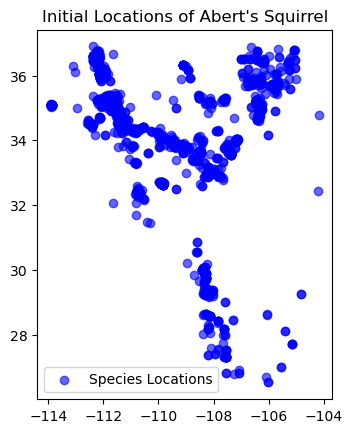

Starting population: 2367

Preferences for new individuals saved to individual_preferences.csv
Year 1 population: 2516


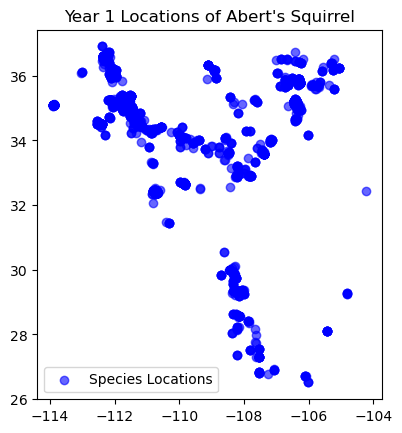

Year 1 simulation time - 0:00:10.177805

Preferences for new individuals saved to individual_preferences.csv
Year 2 population: 2490


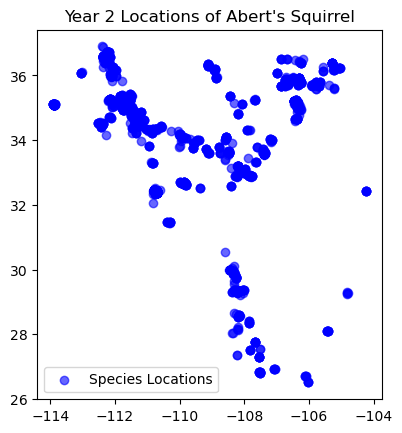

Year 2 simulation time - 0:00:17.464691

Preferences for new individuals saved to individual_preferences.csv
Year 3 population: 2620


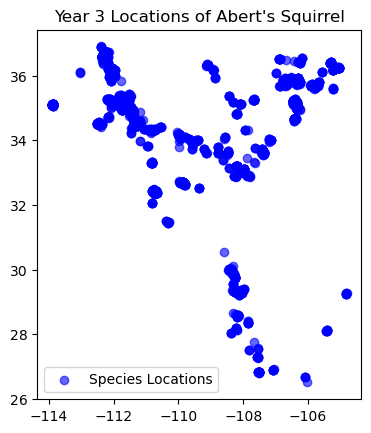

Year 3 simulation time - 0:00:24.116091



KeyboardInterrupt: 

In [178]:
# First Simulation
runSim(
    numYears = 50,
    speciesData = aberts,
    carryingCap = len(aberts),
    birthRate = .45,
    avgBirths = 3,
    maxBirths = 5,
    avgLifespan = 7,
    speciesName = "Abert's Squirrel",
    maxAge = 12,
    infantMort = 0.8,
    precipRasters = precRasts,
    tempRasters = tempRasts,
    ndviRaster = ndviRast,
    tempKDEs = tempKDEs, 
    precKDEs = precKDEs, 
    ndviKDE = ndviKDE,
    lineGraph = 'First Simulation'
)

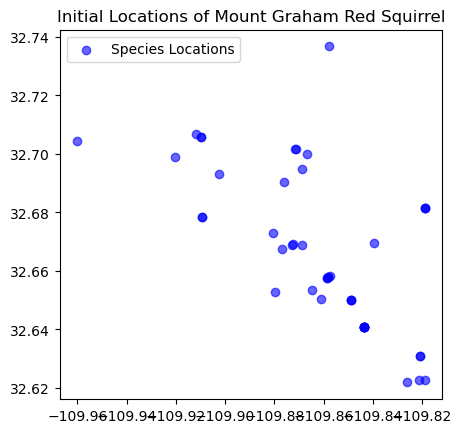

Starting population: 46

Preferences for new individuals saved to individual_preferences.csv
Year 1 population: 61


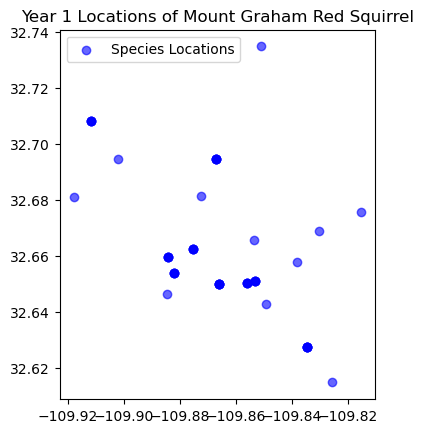

Year 1 simulation time - 0:00:00.482976

Preferences for new individuals saved to individual_preferences.csv
Year 2 population: 56


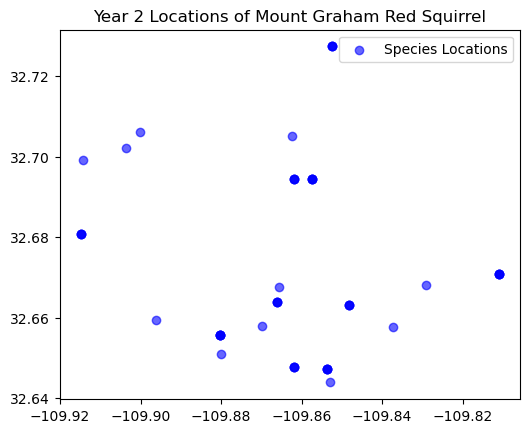

Year 2 simulation time - 0:00:00.741545

Preferences for new individuals saved to individual_preferences.csv
Year 3 population: 42


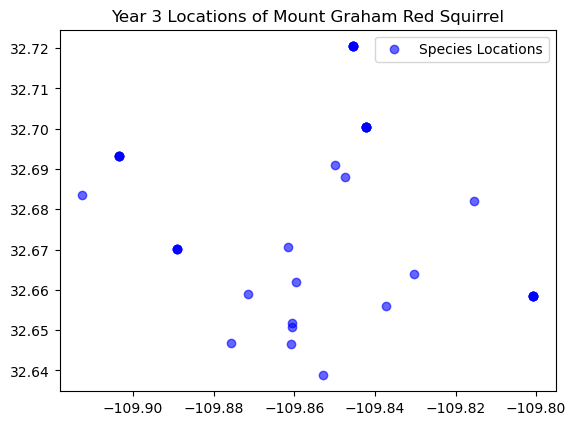

Year 3 simulation time - 0:00:00.980828

Preferences for new individuals saved to individual_preferences.csv
Year 4 population: 54


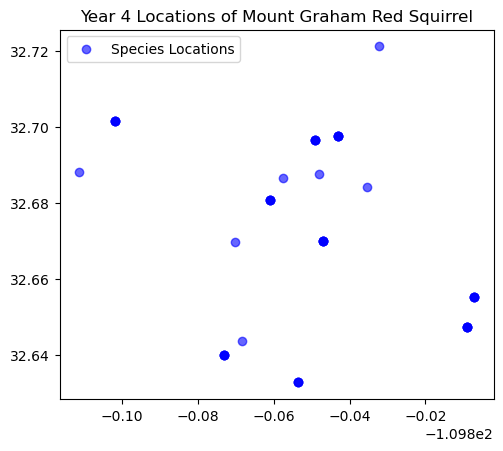

Year 4 simulation time - 0:00:01.216509

Preferences for new individuals saved to individual_preferences.csv
Year 5 population: 74


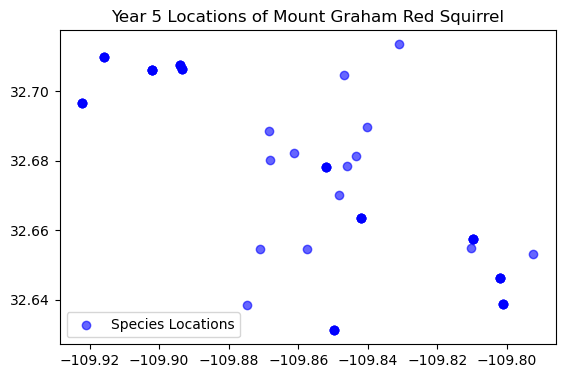

Year 5 simulation time - 0:00:01.505374

Preferences for new individuals saved to individual_preferences.csv
Year 6 population: 65


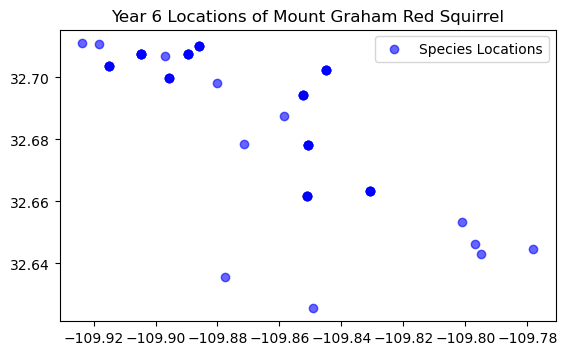

Year 6 simulation time - 0:00:01.741701

Preferences for new individuals saved to individual_preferences.csv
Year 7 population: 72


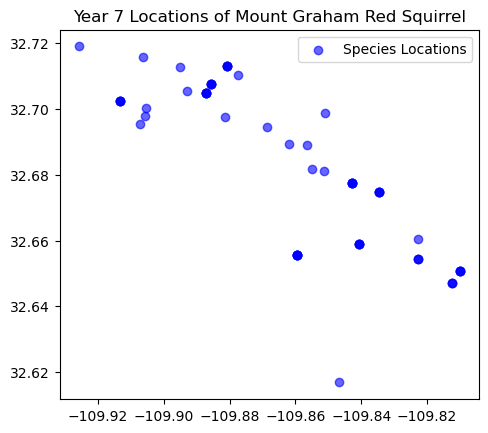

Year 7 simulation time - 0:00:01.971197

Preferences for new individuals saved to individual_preferences.csv
Year 8 population: 72


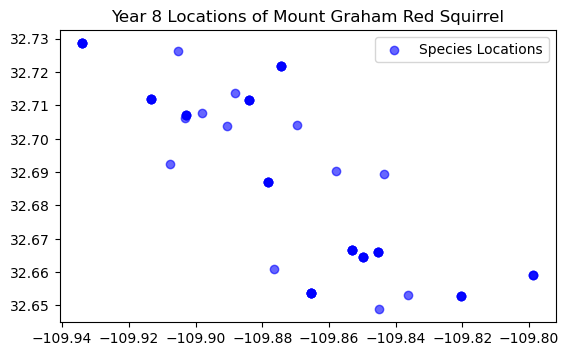

Year 8 simulation time - 0:00:02.306129

Preferences for new individuals saved to individual_preferences.csv
Year 9 population: 57


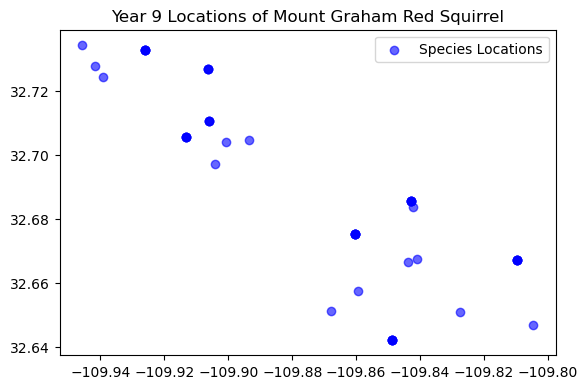

Year 9 simulation time - 0:00:02.638415

Preferences for new individuals saved to individual_preferences.csv
Year 10 population: 59


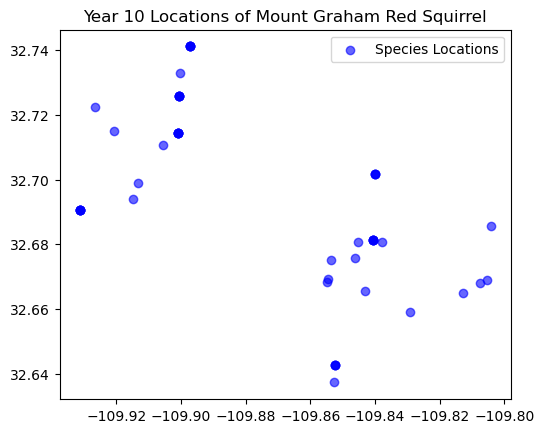

Year 10 simulation time - 0:00:02.903748

Preferences for new individuals saved to individual_preferences.csv
Year 11 population: 79


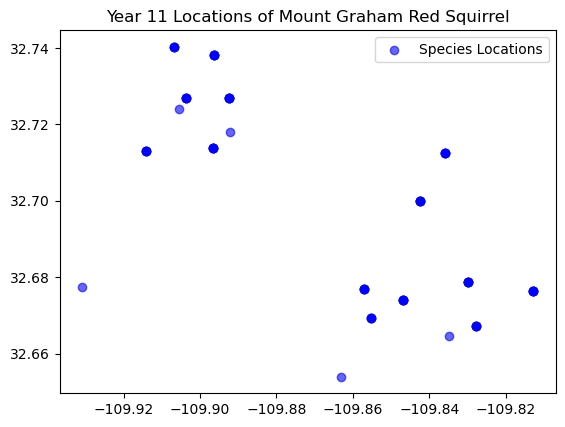

Year 11 simulation time - 0:00:03.209103

Preferences for new individuals saved to individual_preferences.csv
Year 12 population: 74


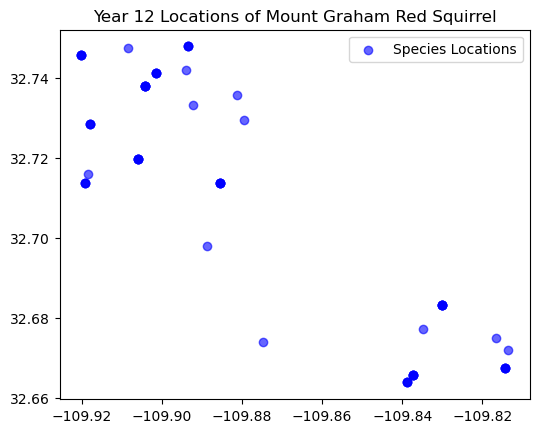

Year 12 simulation time - 0:00:03.568407

Preferences for new individuals saved to individual_preferences.csv
Year 13 population: 59


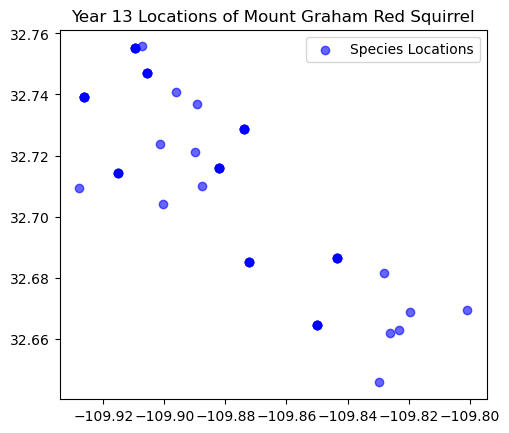

Year 13 simulation time - 0:00:03.804411

Preferences for new individuals saved to individual_preferences.csv
Year 14 population: 90


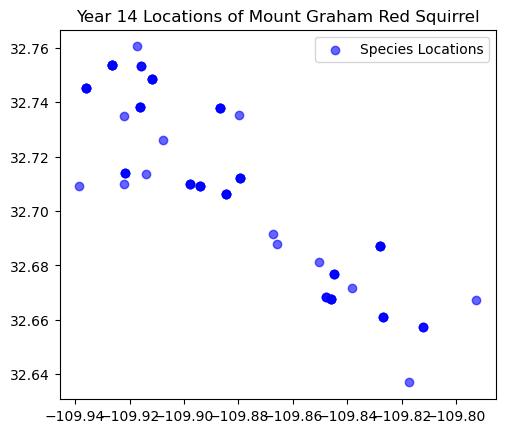

Year 14 simulation time - 0:00:04.195018

Preferences for new individuals saved to individual_preferences.csv
Year 15 population: 69


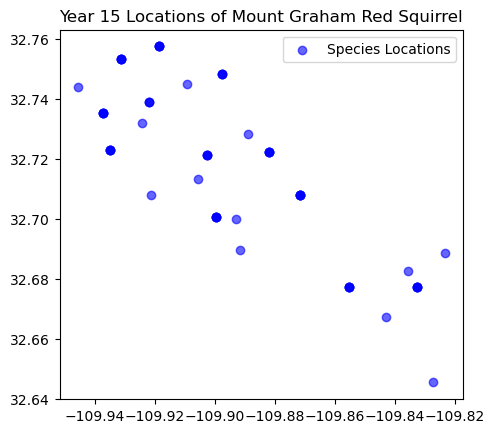

Year 15 simulation time - 0:00:04.511553

Preferences for new individuals saved to individual_preferences.csv
Year 16 population: 55


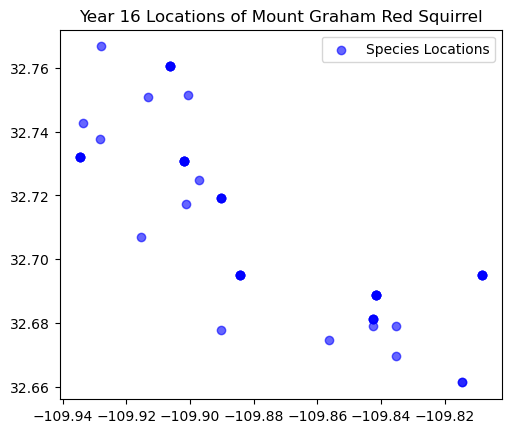

Year 16 simulation time - 0:00:04.853849

Preferences for new individuals saved to individual_preferences.csv
Year 17 population: 53


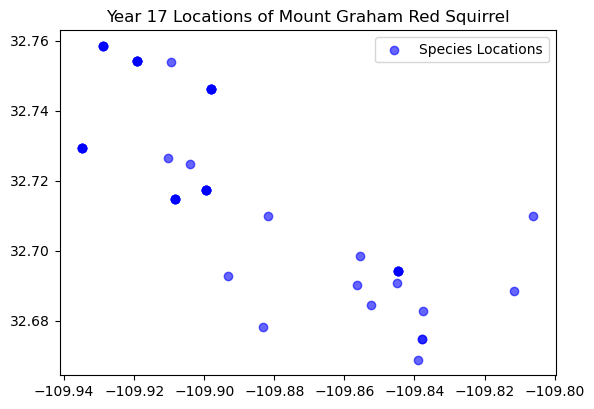

Year 17 simulation time - 0:00:05.144405

Preferences for new individuals saved to individual_preferences.csv
Year 18 population: 82


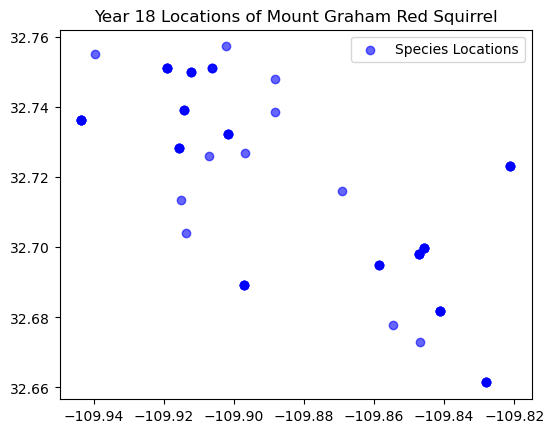

Year 18 simulation time - 0:00:05.530917

Preferences for new individuals saved to individual_preferences.csv
Year 19 population: 66


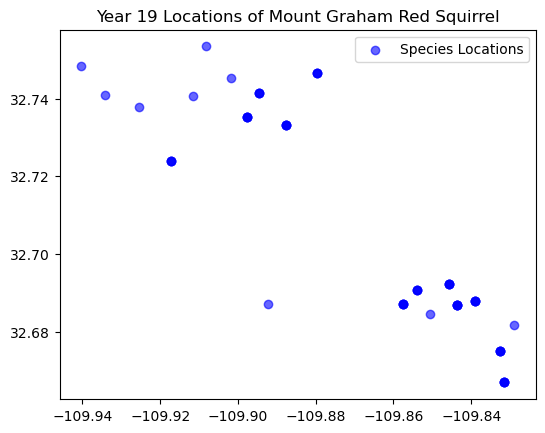

Year 19 simulation time - 0:00:05.725990

Preferences for new individuals saved to individual_preferences.csv
Year 20 population: 58


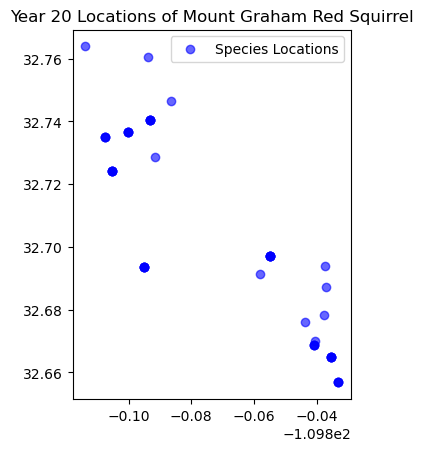

Year 20 simulation time - 0:00:06.067513

Preferences for new individuals saved to individual_preferences.csv
Year 21 population: 58


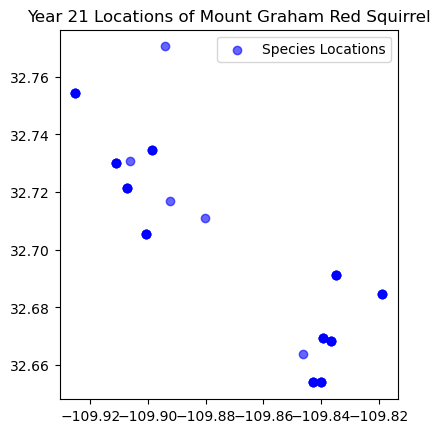

Year 21 simulation time - 0:00:06.501724

Preferences for new individuals saved to individual_preferences.csv
Year 22 population: 64


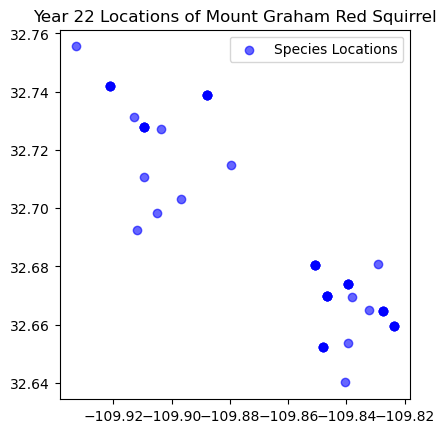

Year 22 simulation time - 0:00:06.769052

Preferences for new individuals saved to individual_preferences.csv
Year 23 population: 86


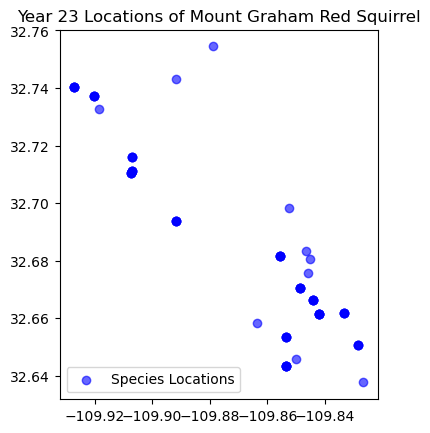

Year 23 simulation time - 0:00:07.051515

Preferences for new individuals saved to individual_preferences.csv
Year 24 population: 48


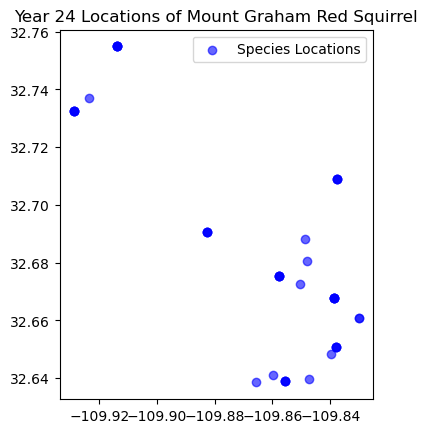

Year 24 simulation time - 0:00:07.302044

Preferences for new individuals saved to individual_preferences.csv
Year 25 population: 70


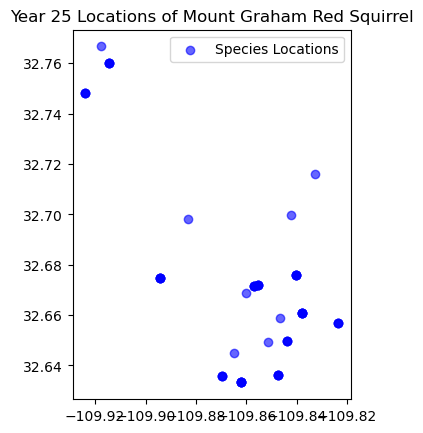

Year 25 simulation time - 0:00:07.646442

Preferences for new individuals saved to individual_preferences.csv
Year 26 population: 69


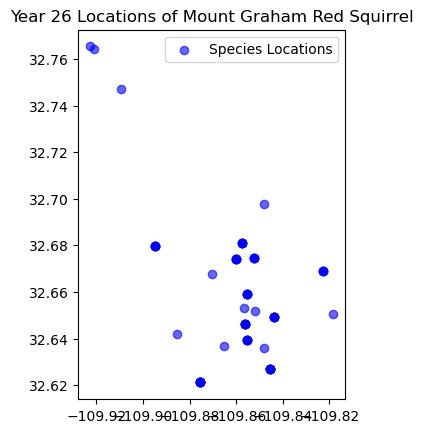

Year 26 simulation time - 0:00:08.054245

Preferences for new individuals saved to individual_preferences.csv
Year 27 population: 82


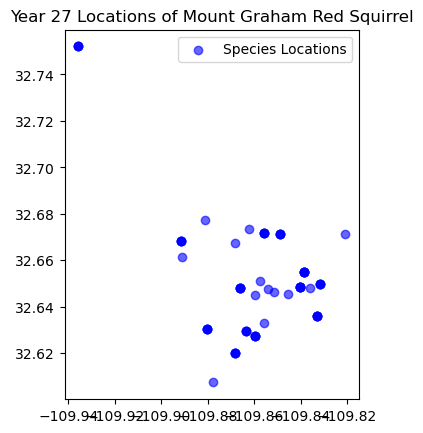

Year 27 simulation time - 0:00:08.368050

Preferences for new individuals saved to individual_preferences.csv
Year 28 population: 67


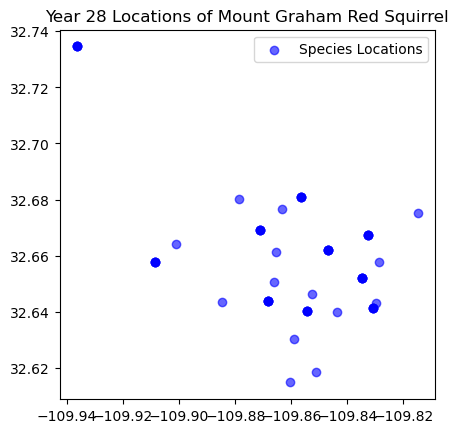

Year 28 simulation time - 0:00:08.651118

Preferences for new individuals saved to individual_preferences.csv
Year 29 population: 63


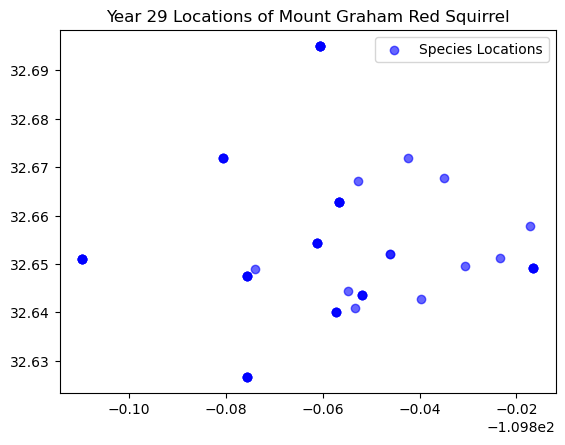

Year 29 simulation time - 0:00:08.909250

Preferences for new individuals saved to individual_preferences.csv
Year 30 population: 49


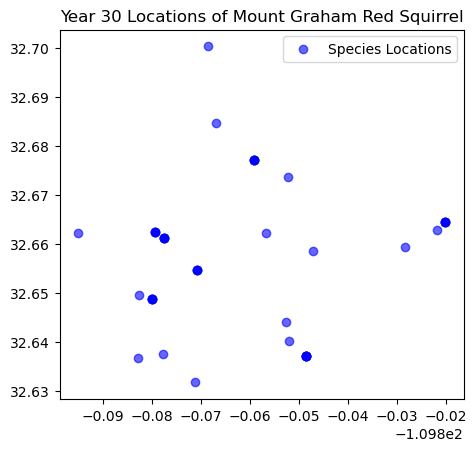

Year 30 simulation time - 0:00:09.253189

Preferences for new individuals saved to individual_preferences.csv
Year 31 population: 61


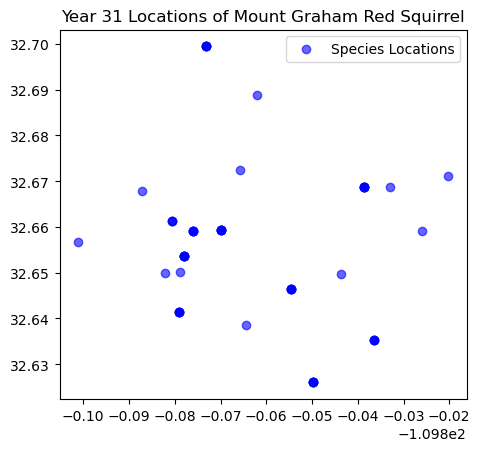

Year 31 simulation time - 0:00:09.529203

Preferences for new individuals saved to individual_preferences.csv
Year 32 population: 58


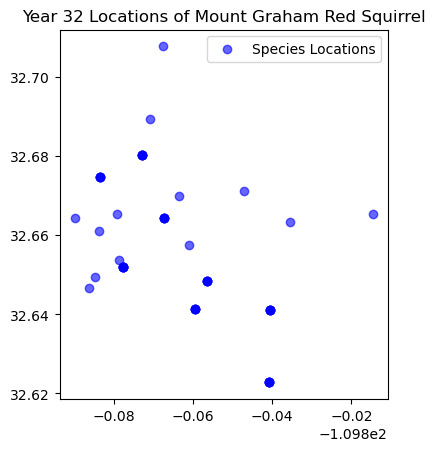

Year 32 simulation time - 0:00:09.767271

Preferences for new individuals saved to individual_preferences.csv
Year 33 population: 49


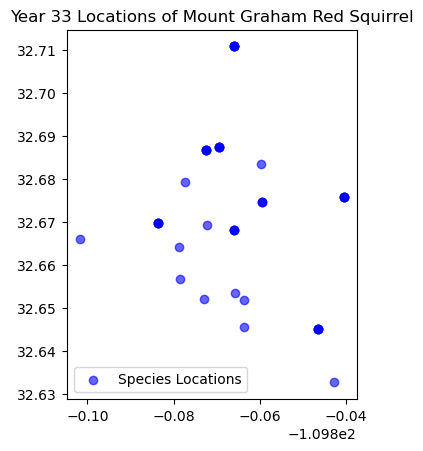

Year 33 simulation time - 0:00:10.069910

Preferences for new individuals saved to individual_preferences.csv
Year 34 population: 62


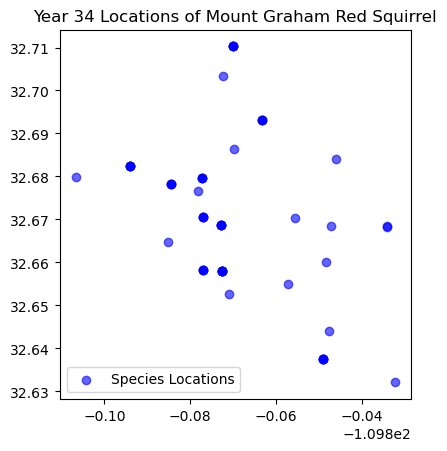

Year 34 simulation time - 0:00:10.336336

Preferences for new individuals saved to individual_preferences.csv
Year 35 population: 75


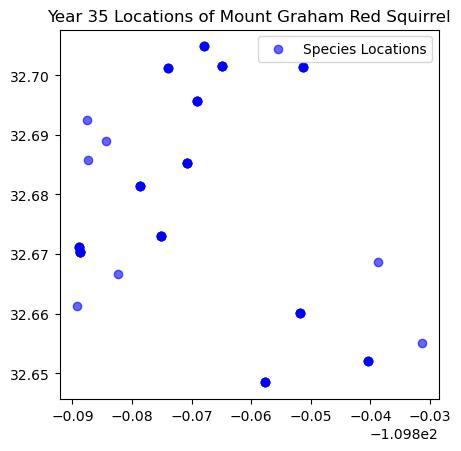

Year 35 simulation time - 0:00:10.662464

Preferences for new individuals saved to individual_preferences.csv
Year 36 population: 86


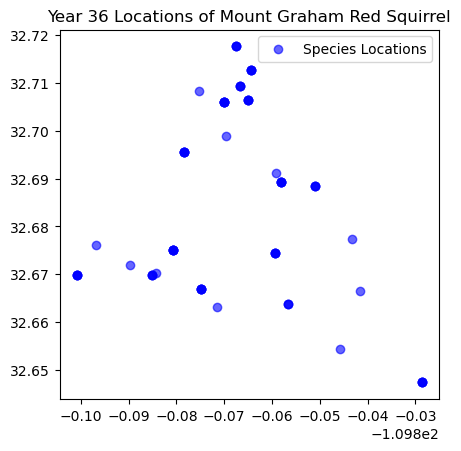

Year 36 simulation time - 0:00:10.951986

Preferences for new individuals saved to individual_preferences.csv
Year 37 population: 60


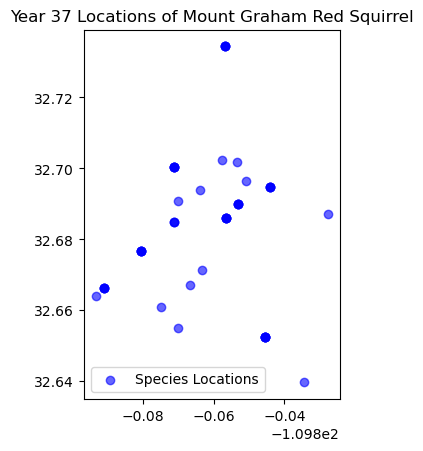

Year 37 simulation time - 0:00:11.178377

Preferences for new individuals saved to individual_preferences.csv
Year 38 population: 68


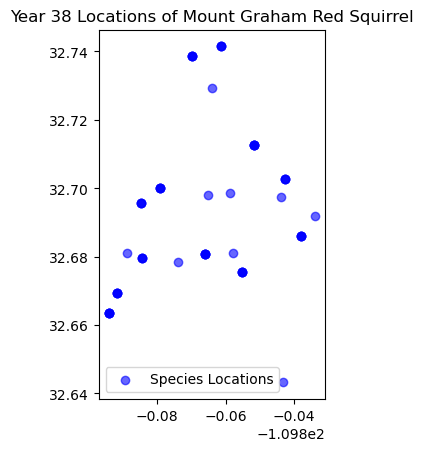

Year 38 simulation time - 0:00:11.450361

Preferences for new individuals saved to individual_preferences.csv
Year 39 population: 78


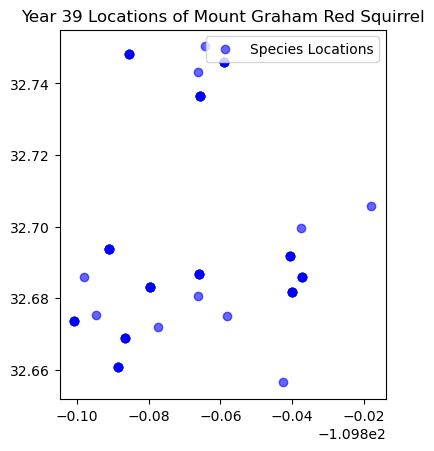

Year 39 simulation time - 0:00:11.698930

Preferences for new individuals saved to individual_preferences.csv
Year 40 population: 59


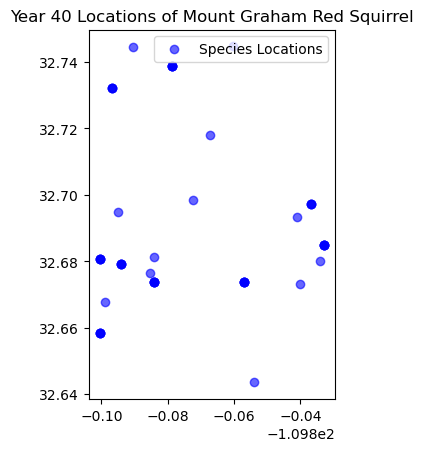

Year 40 simulation time - 0:00:12.041463

Preferences for new individuals saved to individual_preferences.csv
Year 41 population: 65


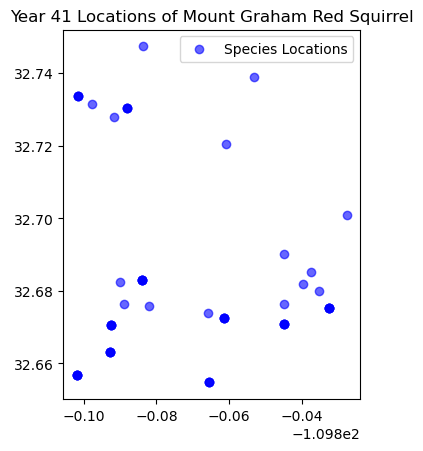

Year 41 simulation time - 0:00:12.306666

Preferences for new individuals saved to individual_preferences.csv
Year 42 population: 50


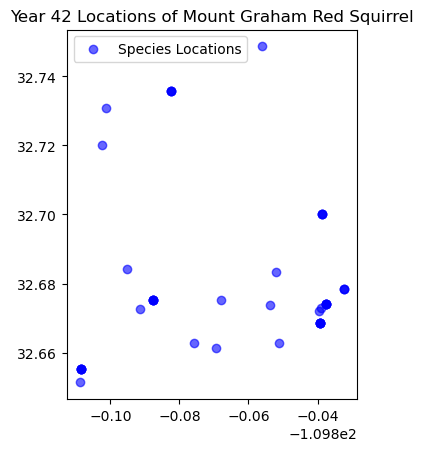

Year 42 simulation time - 0:00:12.608597

Preferences for new individuals saved to individual_preferences.csv
Year 43 population: 60


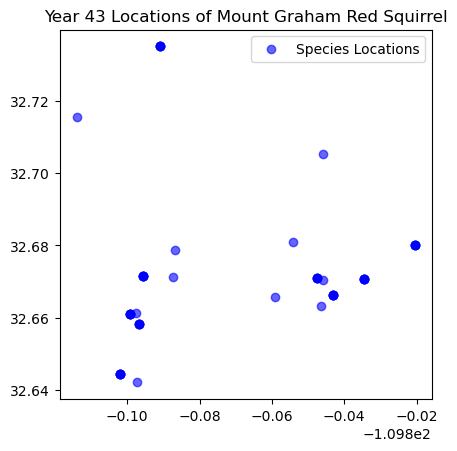

Year 43 simulation time - 0:00:12.835525

Preferences for new individuals saved to individual_preferences.csv
Year 44 population: 59


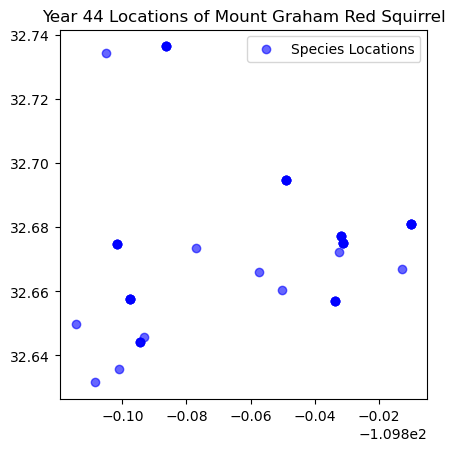

Year 44 simulation time - 0:00:13.115646

Preferences for new individuals saved to individual_preferences.csv
Year 45 population: 41


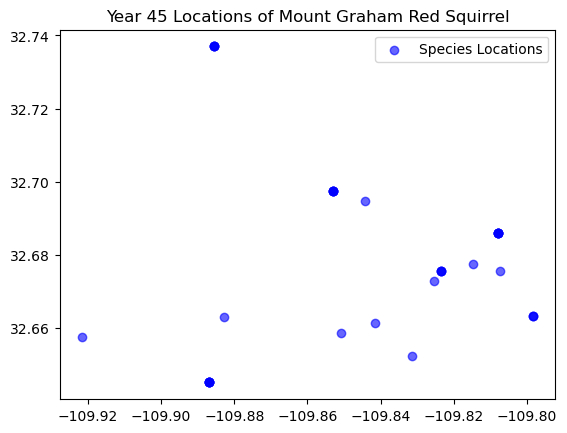

Year 45 simulation time - 0:00:13.359192

Preferences for new individuals saved to individual_preferences.csv
Year 46 population: 53


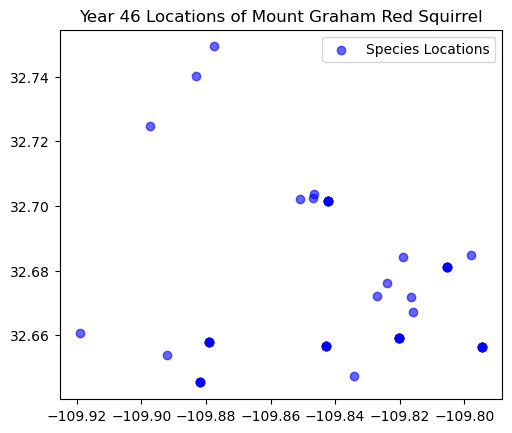

Year 46 simulation time - 0:00:13.708187

Preferences for new individuals saved to individual_preferences.csv
Year 47 population: 77


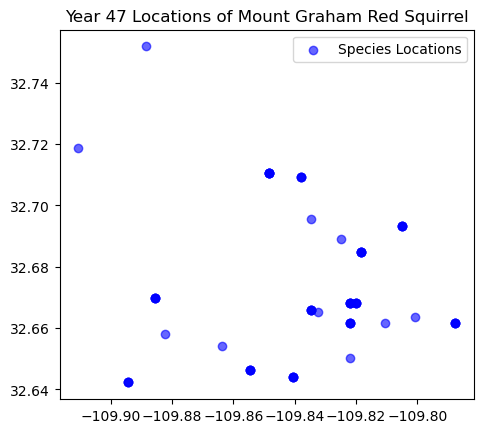

Year 47 simulation time - 0:00:14.282619

Preferences for new individuals saved to individual_preferences.csv
Year 48 population: 63


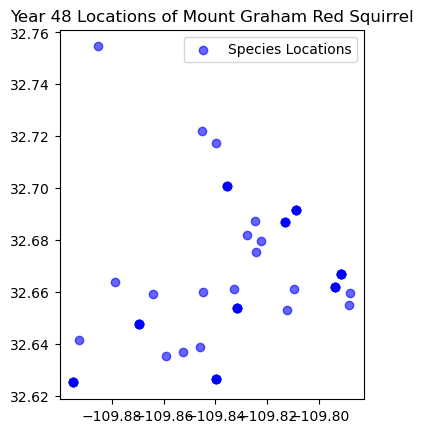

Year 48 simulation time - 0:00:14.619442

Preferences for new individuals saved to individual_preferences.csv
Year 49 population: 79


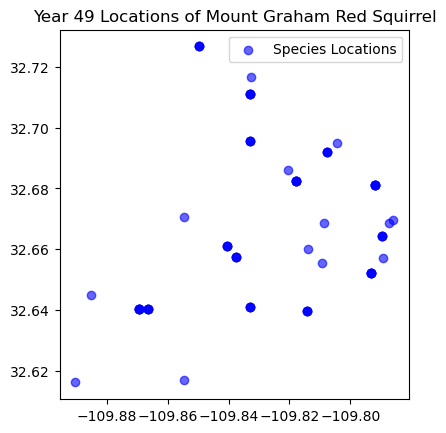

Year 49 simulation time - 0:00:14.951318

Preferences for new individuals saved to individual_preferences.csv
Year 50 population: 55


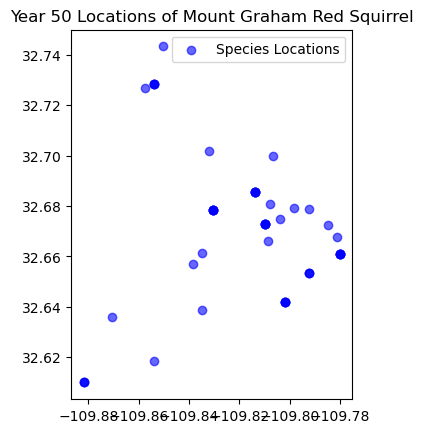

Year 50 simulation time - 0:00:15.223593



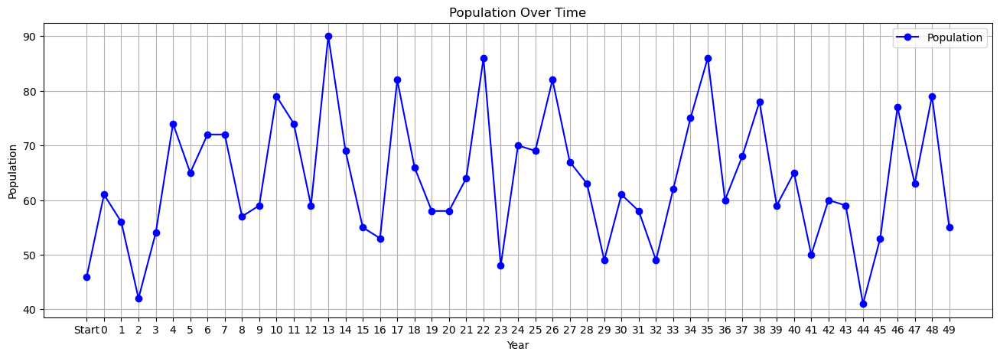


Simulation complete.
Simulation runtime - 0:00:16.204126


C:\Users\ericg\anaconda3\Lib\site-packages\pyogrio\raw.py:698: UserWarning: 'crs' was not provided.  The output dataset will not have projection information defined and may not be usable in other systems.
  warnings.warn(


In [32]:
# First Simulation
runSim(
    numYears = 50,
    speciesData = mt_graham_red_squirrel,
    carryingCap = len(mt_graham_red_squirrel),
    birthRate = .475,
    avgBirths = 4,
    maxBirths = 8,
    avgLifespan = 5,
    speciesName = "Mount Graham Red Squirrel",
    maxAge = 10,
    infantMort = 0.75,
    precipRasters = precRasts,
    tempRasters = tempRasts,
    ndviRaster = ndviRast,
    tempKDEs = tempKDEs, 
    precKDEs = precKDEs, 
    ndviKDE = ndviKDE,
    lineGraph = 'First Simulation - Mt. Graham Red Squirrel'
)

In [151]:
# Load GeoJSON files into GeoDataFrames
gdf1 = gpd.read_file('initialPop.geojson')  # Replace with your file path
gdf2 = gpd.read_file('finalPop.geojson')  # Replace with your file path

# Create a base map centered on the mean of the coordinates of the first GeoDataFrame
center_coords = [gdf1.geometry.y.mean(), gdf1.geometry.x.mean()]
m = folium.Map(location=center_coords, zoom_start=5)

# Add satellite basemap from Esri
folium.TileLayer(
    tiles="https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}",
    attr="Esri",
    name="Esri Satellite",
    overlay=False,
    control=True
).add_to(m)

# Add first GeoDataFrame points with color 'blue'
for _, row in gdf1.iterrows():
    if isinstance(row.geometry, Point):  # Only add point geometries
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=1,
            color='blue',
            fill=True,
            fill_color='blue',
            fill_opacity=0.6
        ).add_to(m)

# Add second GeoDataFrame points with color 'red'
for _, row in gdf2.iterrows():
    if isinstance(row.geometry, Point):  # Only add point geometries
        folium.CircleMarker(
            location=[row.geometry.y, row.geometry.x],
            radius=1,
            color='red',
            fill=True,
            fill_color='red',
            fill_opacity=0.6
        ).add_to(m)

# Add a layer control to toggle between layers
folium.LayerControl().add_to(m)

# Save the map to an HTML file
m.save('Initial and Final Individual Positions.html')

# If you're in a Jupyter notebook, display the map
m

Skipping field value: unsupported OGR type: 3
